# Comp1-传统组学

主要适配于传统组学的建模和刻画。典型的应用场景探究rad_score最最终临床诊断的作用。

数据的一般形式为(具体文件,文件夹名可以不同)：
1. `images`文件夹，存放研究对象所有的CT、MRI等数据。
2. `masks`文件夹, 存放手工（Manuelly）勾画的ROI区域。与images文件夹的文件意义对应。
3. `label.txt`文件，每个患者对应的标签，例如肿瘤的良恶性、5年存活状态等。

## Onekey步骤

1. 数据校验，检查数据格式是否正确。
2. 组学特征提取，如果第一步检查数据通过，则提取对应数据的特征。
3. 读取标注数据信息。
4. 特征与标注数据拼接。形成数据集。
5. 查看一些统计信息，检查数据时候存在异常点。
6. 正则化，将数据变化到服从 N~(0, 1)。
7. 通过相关系数，例如spearman、person等筛选出特征。
8. 构建训练集和测试集，这里使用的是随机划分，正常多中心验证，需要大家根据自己的场景构建两份数据。
9. 通过Lasso筛选特征，选取其中的非0项作为后续模型的特征。
10. 使用机器学习算法，例如LR、SVM、RF等进行任务学习。
11. 模型结果可视化，例如AUC、ROC曲线，混淆矩阵等。


In [1]:
## 获得视频教程
from onekey_algo.custom.Manager import onekey_show
onekey_show('传统组学任务')

[2025-10-13 20:33:47 - <frozen onekey_algo.custom.Manager>: 138]	INFO	播放视频功能已经设置成：Disable！


## 一、数据校验
首先需要检查诊断数据，如果显示`检查通过！`择可以正常运行之后的，否则请根据提示调整数据。

**注意**：这里要求images和masks文件夹中的文件名必须一一对应。e.g. `1.nii.gz`为images中的一个文件，在masks文件夹必须也存在一个`1.nii.gz`文件。

当然也可以使用自定义的函数，获取解析数据。

In [2]:
# 数据检验视频
onekey_show('传统组学任务|数据检验')

[2025-10-13 20:33:47 - <frozen onekey_algo.custom.Manager>: 138]	INFO	播放视频功能已经设置成：Disable！


### 指定数据

此模块有3个需要自己定义的参数

1. `mydir`: 数据存放的路径。
2. `labelf`: 每个样本的标注信息文件。
3. `labels`: 要让AI系统学习的目标，例如肿瘤的良恶性、T-stage等。

### 多模态设置

这个地方可以指定多模态类型，每种模态一个文件夹，每个文件夹里面同样包括images, masks文件夹。例如包括CT、DWI两个模态。

```python
modals = get_param_in_cwd('radio_dir') or ['CT', 'DWI']
```

In [3]:
import os
from IPython.display import display
os.environ['KMP_DUPLICATE_LIB_OK'] = 'TRUE'
from onekey_algo import OnekeyDS as okds
from onekey_algo import get_param_in_cwd

os.makedirs('img', exist_ok=True)
os.makedirs('results', exist_ok=True)
os.makedirs('features', exist_ok=True)

# 设置数据目录
modals = ['SWE']
mydir = get_param_in_cwd('radio_dir')
# 这个地方可以指定多模态类型，每种模态一个文件夹，每个文件夹里面同样包括images, masks文件夹。
assert all(sm in get_param_in_cwd('multi_modal') for sm in modals)
if mydir == okds.ct:
    print(f'正在使用Onekey数据：{okds.ct}，如果不符合预期，请修改目录位置！')
# 对应的标签文件
# labelf = r'你自己标注数据的文件地址'
labelf = get_param_in_cwd('label_file')
# 读取标签数据列名
labels = [get_param_in_cwd('task_column') or 'label']
# 获取分组列名
group_info = get_param_in_cwd('dataset_column')

### images和masks匹配

这里要求images和masks文件夹中的文件名必须一一对应。e.g. `1.nii.gz`为images中的一个文件，在masks文件夹必须也存在一个`1.nii.gz`文件。

当然也可以使用自定义的函数，获取解析数据。

In [4]:
from pathlib import Path
from onekey_algo.custom.components.Radiology import diagnose_3d_image_mask_settings, get_image_mask_from_dir

# 生成images和masks对，一对一的关系。也可以自定义替换。
task_type = '_'.join(modals) + '_'
for modal in modals:
    images, masks = get_image_mask_from_dir(os.path.join(mydir, modal), images='images', masks='masks')
    diagnose_3d_image_mask_settings(images, masks)
    print(f'模态：{modal}，获取到{len(images)}个样本。')

检查通过！
模态：SWE，获取到35个样本。


# 传统组学特征

使用pyradiomics提取传统组学特征，正常这块不需要修改，下面是具体的Onekey封装的接口。

```python
def extract(self, images: Union[str, List[str]], 
            masks: Union[str, List[str]], labels: Union[int, List[int]] = 1, settings=None)
"""
    * images: List结构，待提取的图像列表。
    * masks: List结构，待提取的图像对应的mask，与Images必须一一对应。
    * labels: 提取标注为什么标签的特征。默认为提取label=1的。
    * settings: 其他提取特征的参数。默认为None。

"""
```

```python
def get_label_data_frame(self, label: int = 1, column_names=None, images='images', masks='labels')
"""
    * label: 获取对应label的特征。
    * columns_names: 默认为None，使用程序设定的列名即可。
"""
```
    
```python
def get_image_mask_from_dir(root, images='images', masks='labels')
"""
    * root: 待提取特征的目录。
    * images: root目录中原始数据的文件夹名。
    * masks: root目录中标注数据的文件夹名。
"""
```


In [5]:
# 特征提取视频
onekey_show('传统组学任务|特征提取')

[2025-10-13 20:33:56 - <frozen onekey_algo.custom.Manager>: 138]	INFO	播放视频功能已经设置成：Disable！


In [5]:
import warnings
import pandas as pd
 
warnings.filterwarnings("ignore")

from onekey_algo.custom.components.Radiology import ConventionalRadiomics

rad_ = None
param_file = get_param_in_cwd('extractor_settings')
for modal in modals:
    if os.path.exists(f'features/rad_features_{modal}.csv'):
        rad_data = pd.read_csv(f'features/rad_features_{modal}.csv', header=0)
    else:
        images, masks = get_image_mask_from_dir(os.path.join(mydir, modal), images='images', masks='masks')
        radiomics = ConventionalRadiomics(param_file, correctMask=True)
        radiomics.extract(images, masks, workers=1, labels=1, with_fd=get_param_in_cwd('with_fd', False))
        rad_data = radiomics.get_label_data_frame(label=1)
        rad_data.columns = [f"{c.replace('-', '_')}_{modal}" if c != 'ID' else 'ID' for c in rad_data.columns]
        rad_data.to_csv(f'features/rad_features_{modal}.csv', header=True, index=False)
    if rad_ is None:
        rad_ = rad_data
    else:
        rad_ = pd.merge(rad_, rad_data, on='ID', how='inner')
rad_data = rad_
rad_data

[2025-10-15 21:28:33 - <frozen onekey_algo.custom.components.Radiology>: 578]	INFO	使用E:\\onekey_comp\\comp9-Solutions\\sol7. 传统组学-多中心-多模态 - 模态对比 -临床\\custom_settings\\exampleUS.yaml的配置文件。
[2025-10-15 21:28:33 - core.py: 188]	INFO	validation.valid
[2025-10-15 21:28:33 - <frozen onekey_algo.custom.components.Radiology>: 621]	INFO	Extracting features, 海森矩阵：False, 分形特征：False，拓扑学特征：False
[2025-10-15 21:28:33 - <frozen onekey_algo.custom.components.Radiology>: 642]	INFO		Extracting feature from C:\Users\aspir\Desktop\Sunimages2\SWE\images\bianyongping2.nii.gz using C:\Users\aspir\Desktop\Sunimages2\SWE\masks\bianyongping2.nii.gz label 1
[2025-10-15 21:28:34 - <frozen onekey_algo.custom.components.Radiology>: 642]	INFO		Extracting feature from C:\Users\aspir\Desktop\Sunimages2\SWE\images\chenlanfang2.nii.gz using C:\Users\aspir\Desktop\Sunimages2\SWE\masks\chenlanfang2.nii.gz label 1
[2025-10-15 21:28:34 - <frozen onekey_algo.custom.components.Radiology>: 642]	INFO		Extracting feature from C:

[2025-10-15 21:28:41 - <frozen onekey_algo.custom.components.Radiology>: 642]	INFO		Extracting feature from C:\Users\aspir\Desktop\Sunimages2\SWE\images\zhuangcaiying2.nii.gz using C:\Users\aspir\Desktop\Sunimages2\SWE\masks\zhuangcaiying2.nii.gz label 1
[2025-10-15 21:28:41 - <frozen onekey_algo.custom.components.Radiology>: 642]	INFO		Extracting feature from C:\Users\aspir\Desktop\Sunimages2\SWE\images\zhuangjuhua2.nii.gz using C:\Users\aspir\Desktop\Sunimages2\SWE\masks\zhuangjuhua2.nii.gz label 1
[2025-10-15 21:28:41 - <frozen onekey_algo.custom.components.Radiology>: 642]	INFO		Extracting feature from C:\Users\aspir\Desktop\Sunimages2\SWE\images\zhuxiaofang2.nii.gz using C:\Users\aspir\Desktop\Sunimages2\SWE\masks\zhuxiaofang2.nii.gz label 1
[2025-10-15 21:28:41 - <frozen onekey_algo.custom.components.Radiology>: 705]	INFO	特征提取完成！


,ID,exponential_firstorder_10Percentile_SWE,exponential_firstorder_90Percentile_SWE,exponential_firstorder_Energy_SWE,exponential_firstorder_Entropy_SWE,exponential_firstorder_InterquartileRange_SWE,exponential_firstorder_Kurtosis_SWE,exponential_firstorder_Maximum_SWE,exponential_firstorder_Mean_SWE,exponential_firstorder_MeanAbsoluteDeviation_SWE,...,wavelet_LLL_glszm_SmallAreaHighGrayLevelEmphasis_SWE,wavelet_LLL_glszm_SmallAreaLowGrayLevelEmphasis_SWE,wavelet_LLL_glszm_ZoneEntropy_SWE,wavelet_LLL_glszm_ZonePercentage_SWE,wavelet_LLL_glszm_ZoneVariance_SWE,wavelet_LLL_ngtdm_Busyness_SWE,wavelet_LLL_ngtdm_Coarseness_SWE,wavelet_LLL_ngtdm_Complexity_SWE,wavelet_LLL_ngtdm_Contrast_SWE,wavelet_LLL_ngtdm_Strength_SWE
bianyongping2.nii.gz,bianyongping2.nii.gz,2.287,6.177,1.235e+09,0.981,2.092,5.029,12.485,4.400,1.250,...,17.861,0.013,5.842,0.145,162.052,0.801,0.013,24.015,0.023,0.743
chenlanfang2.nii.gz,chenlanfang2.nii.gz,1.710,6.122,1.232e+09,0.690,2.244,4.949,11.094,3.420,1.417,...,22.355,0.016,5.878,0.203,54.302,1.081,0.015,33.621,0.038,0.849
gechengyun2.nii.gz,gechengyun2.nii.gz,2.029,6.082,1.234e+09,0.874,2.740,2.210,8.893,3.973,1.366,...,12.700,0.014,5.674,0.114,198.034,1.604,0.015,12.766,0.046,0.406
gekunjian2.nii.gz,gekunjian2.nii.gz,5.197,11.172,1.244e+09,1.097,2.697,3.375,17.497,8.042,1.730,...,7.159,0.030,5.594,0.077,2132.957,1.703,0.009,13.389,0.013,0.321
guoshaohong2.nii.gz,guoshaohong2.nii.gz,2.789,6.659,1.235e+09,1.005,2.023,4.799,12.397,4.651,1.238,...,13.002,0.025,5.734,0.143,254.371,1.339,0.010,19.574,0.025,0.389
hanguomei2.nii.gz,hanguomei2.nii.gz,2.595,9.191,1.239e+09,1.233,4.129,2.619,14.614,5.997,2.115,...,10.941,0.021,5.732,0.115,339.239,0.911,0.017,17.990,0.039,0.719
huanghongmei2.nii.gz,huanghongmei2.nii.gz,2.246,6.571,1.235e+09,0.936,2.537,2.796,10.663,4.369,1.381,...,17.772,0.021,5.740,0.152,205.394,0.988,0.014,22.115,0.035,0.576
huangyafang2.nii.gz,huangyafang2.nii.gz,3.656,8.605,1.239e+09,1.076,2.434,3.251,13.621,6.006,1.535,...,12.822,0.015,5.891,0.138,130.870,1.278,0.011,18.831,0.029,0.426
jiangzhaoming2.nii.gz,jiangzhaoming2.nii.gz,4.164,8.616,1.240e+09,0.832,2.133,3.481,13.018,6.450,1.351,...,8.984,0.008,5.315,0.057,1441.678,0.965,0.011,14.996,0.012,0.642
jiangziqiao2.nii.gz,jiangziqiao2.nii.gz,2.403,4.823,1.233e+09,0.425,1.228,3.289,7.202,3.526,0.771,...,8.677,0.018,5.434,0.073,1394.815,1.925,0.012,9.015,0.019,0.274


## 特征统计

,0,count
1,firstorder,238
0,glcm,278
3,gldm,163
2,glrlm,192
4,glszm,156
5,ngtdm,51


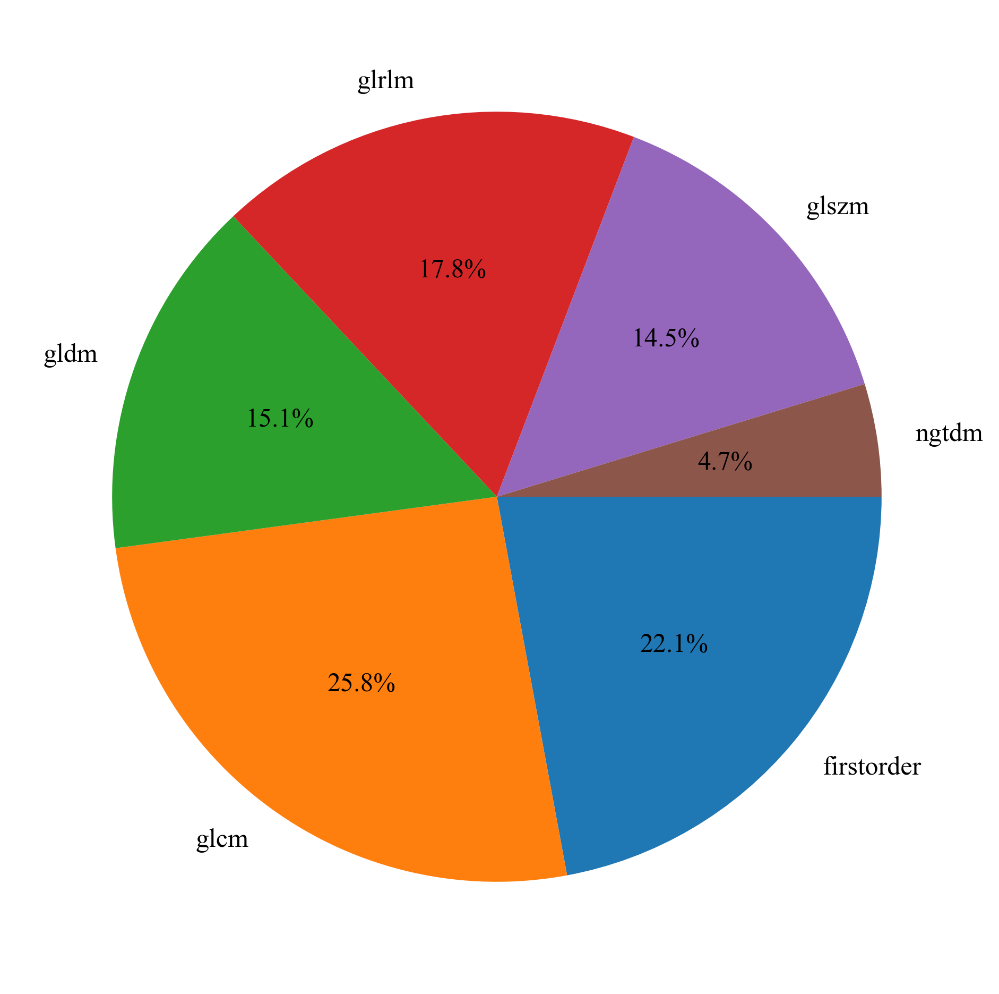

In [7]:
import matplotlib.pyplot as plt
sorted_counts = pd.DataFrame([c.split('_')[-3] for c in rad_data.columns if c !='ID']).value_counts()
sorted_counts = pd.DataFrame(sorted_counts, columns=['count']).reset_index()
sorted_counts = sorted_counts.sort_values(0)
display(sorted_counts)
plt.pie(sorted_counts['count'], labels=[i for i in sorted_counts[0]], startangle=0,
        counterclock = False, autopct = '%.1f%%')
plt.savefig(f'img/{task_type}feature_ratio.svg', bbox_inches = 'tight')

## 标注数据

数据以csv格式进行存储，这里如果是其他格式，可以使用自定义函数读取出每个样本的结果。

要求label_data为一个`DataFrame`格式，包括ID列以及后续的labels列，可以是多列，支持Multi-Task。

In [8]:
label_data = pd.read_csv(labelf)
label_data['ID'] = label_data['ID'].map(lambda x: f"{x}.nii.gz" if not (f"{x}".endswith('.nii.gz') or  f"{x}".endswith('.nii')) else x)
label_data

,ID,label,group
0,bianhesheng1.nii.gz,0,train
1,caoguomei1.nii.gz,0,train
2,caohanjuan1.nii.gz,0,train
3,caoluqun1.nii.gz,0,test
4,caoxiuju1.nii.gz,1,test
...,...,...,...
137,zhujiahui1.nii.gz,0,test
138,zhumeijuan1.nii.gz,0,train
139,zhuronghua1.nii.gz,0,test
140,zhushuhua1.nii.gz,1,train


## 特征拼接 

将标注数据`label_data`与`rad_data`进行合并，得到训练数据。

**注意：** 
1. 需要删掉ID这一列
2. 如果发现数据少了，需要自行检查数据是否匹配。

In [9]:
from onekey_algo.custom.utils import print_join_info

print_join_info(rad_data, label_data)
combined_data = pd.merge(rad_data, label_data, on=['ID'], how='inner')
ids = combined_data['ID']
combined_data = combined_data.drop(['ID'], axis=1)
print(combined_data[labels].value_counts())
combined_data.columns

[2025-10-13 20:33:57 - <frozen onekey_algo.custom.utils>:  60]	WARNING	存在ID特征不完全匹配的问题！在左边不在右边的ID：{'fengxiufang1.nii.gz', 'xingyuru1.nii.gz', 'zhanghonglan1.nii.gz', 'yeyingqing1.nii.gz', 'dinglaifang1.nii.gz'}；在右边不在左边的ID：set()


label
0        93
1        49
dtype: int64


Index(['exponential_firstorder_10Percentile_SWE',
       'exponential_firstorder_Entropy_SWE',
       'exponential_firstorder_Kurtosis_SWE',
       'exponential_firstorder_Maximum_SWE', 'exponential_firstorder_Mean_SWE',
       'exponential_firstorder_MeanAbsoluteDeviation_SWE',
       'exponential_firstorder_Median_SWE',
       'exponential_firstorder_Minimum_SWE',
       'exponential_firstorder_Range_SWE',
       'exponential_firstorder_RootMeanSquared_SWE',
       ...
       'wavelet_LLL_glszm_GrayLevelNonUniformityNormalized_SWE',
       'wavelet_LLL_glszm_HighGrayLevelZoneEmphasis_SWE',
       'wavelet_LLL_glszm_LargeAreaHighGrayLevelEmphasis_SWE',
       'wavelet_LLL_glszm_SmallAreaHighGrayLevelEmphasis_SWE',
       'wavelet_LLL_glszm_ZoneEntropy_SWE', 'wavelet_LLL_ngtdm_Busyness_SWE',
       'wavelet_LLL_ngtdm_Coarseness_SWE', 'wavelet_LLL_ngtdm_Complexity_SWE',
       'label', 'group'],
      dtype='object', length=1080)

## 获取到数据的统计信息

1. count，统计样本个数。
2. mean、std, 对应特征的均值、方差
3. min, 25%, 50%, 75%, max，对应特征的最小值，25,50,75分位数，最大值。

In [10]:
combined_data.describe()

,exponential_firstorder_10Percentile_SWE,exponential_firstorder_Entropy_SWE,exponential_firstorder_Kurtosis_SWE,exponential_firstorder_Maximum_SWE,exponential_firstorder_Mean_SWE,exponential_firstorder_MeanAbsoluteDeviation_SWE,exponential_firstorder_Median_SWE,exponential_firstorder_Minimum_SWE,exponential_firstorder_Range_SWE,exponential_firstorder_RootMeanSquared_SWE,...,wavelet_LLL_glszm_GrayLevelNonUniformity_SWE,wavelet_LLL_glszm_GrayLevelNonUniformityNormalized_SWE,wavelet_LLL_glszm_HighGrayLevelZoneEmphasis_SWE,wavelet_LLL_glszm_LargeAreaHighGrayLevelEmphasis_SWE,wavelet_LLL_glszm_SmallAreaHighGrayLevelEmphasis_SWE,wavelet_LLL_glszm_ZoneEntropy_SWE,wavelet_LLL_ngtdm_Busyness_SWE,wavelet_LLL_ngtdm_Coarseness_SWE,wavelet_LLL_ngtdm_Complexity_SWE,label
count,142.000,142.000,142.000,142.000,142.000,142.000,142.000,142.000,142.000,142.000,...,142.000,1.420e+02,142.000,142.000,142.000,142.000,1.420e+02,142.000,1.420e+02,142.000
mean,11.392,3.411,17.841,528.116,62.148,49.926,36.847,3.677,524.440,1068.680,...,1.260,9.344e-03,183121.186,188312.536,181857.358,6.839,3.052e-03,0.013,2.072e+06,0.345
std,16.562,1.329,16.562,675.043,73.489,63.179,50.659,4.901,673.488,86.971,...,0.118,9.265e-04,101235.059,103110.327,100816.397,0.107,7.024e-04,0.003,1.447e+06,0.477
min,0.610,0.731,3.681,28.660,3.805,1.855,1.935,0.137,28.314,1003.811,...,1.030,7.745e-03,22045.748,23004.328,21806.103,6.382,1.432e-03,0.006,2.659e+05,0.000
25%,2.211,2.176,7.678,142.378,15.534,14.220,5.312,1.073,141.160,1015.756,...,1.182,8.733e-03,114268.059,115172.236,114022.587,6.789,2.536e-03,0.011,1.033e+06,0.000
50%,4.344,3.401,13.427,262.311,34.781,26.236,14.523,1.749,259.639,1036.020,...,1.246,9.215e-03,166318.931,172285.027,164360.558,6.847,3.098e-03,0.013,1.663e+06,0.000
75%,12.019,4.717,21.462,607.878,82.308,63.589,51.975,3.842,603.728,1086.441,...,1.316,9.727e-03,230097.103,239650.161,227282.693,6.911,3.512e-03,0.016,2.698e+06,1.000
max,104.659,5.576,116.248,3505.223,388.514,394.318,278.611,35.353,3502.254,1456.288,...,1.773,1.343e-02,580660.051,581560.140,580435.029,7.033,5.352e-03,0.022,1.001e+07,1.000


## Z-score

`normalize_df` 为onekey中正则化的API，将数据变化到0均值1方差。正则化的方法为

$column = \frac{column - mean}{std}$

In [11]:
from onekey_algo.custom.components.comp1 import normalize_df
data = normalize_df(combined_data, not_norm=labels, group=group_info)
data = data.dropna(axis=1)
data.describe()

,exponential_firstorder_10Percentile_SWE,exponential_firstorder_Entropy_SWE,exponential_firstorder_Kurtosis_SWE,exponential_firstorder_Maximum_SWE,exponential_firstorder_Mean_SWE,exponential_firstorder_MeanAbsoluteDeviation_SWE,exponential_firstorder_Median_SWE,exponential_firstorder_Minimum_SWE,exponential_firstorder_Range_SWE,exponential_firstorder_RootMeanSquared_SWE,...,wavelet_LLL_glszm_GrayLevelNonUniformity_SWE,wavelet_LLL_glszm_GrayLevelNonUniformityNormalized_SWE,wavelet_LLL_glszm_HighGrayLevelZoneEmphasis_SWE,wavelet_LLL_glszm_LargeAreaHighGrayLevelEmphasis_SWE,wavelet_LLL_glszm_SmallAreaHighGrayLevelEmphasis_SWE,wavelet_LLL_glszm_ZoneEntropy_SWE,wavelet_LLL_ngtdm_Busyness_SWE,wavelet_LLL_ngtdm_Coarseness_SWE,wavelet_LLL_ngtdm_Complexity_SWE,label
count,1.420e+02,1.420e+02,1.420e+02,1.420e+02,1.420e+02,1.420e+02,1.420e+02,1.420e+02,1.420e+02,1.420e+02,...,1.420e+02,1.420e+02,1.420e+02,1.420e+02,1.420e+02,1.420e+02,1.420e+02,1.420e+02,1.420e+02,142.000
mean,1.063e-16,-5.129e-16,-1.063e-16,8.757e-17,2.189e-17,-9.382e-17,7.506e-17,3.440e-17,-3.440e-17,8.467e-16,...,2.633e-15,4.441e-16,-8.444e-17,5.129e-16,2.674e-16,3.215e-15,3.440e-17,-4.191e-16,-1.032e-16,0.345
std,9.964e-01,9.964e-01,9.964e-01,9.964e-01,9.964e-01,9.964e-01,9.964e-01,9.964e-01,9.964e-01,9.964e-01,...,9.964e-01,9.964e-01,9.964e-01,9.964e-01,9.964e-01,9.964e-01,9.964e-01,9.964e-01,9.964e-01,0.477
min,-7.590e-01,-2.030e+00,-9.196e-01,-9.513e-01,-9.801e-01,-1.121e+00,-8.114e-01,-8.104e-01,-9.479e-01,-9.688e-01,...,-2.123e+00,-1.934e+00,-1.568e+00,-1.588e+00,-1.563e+00,-4.156e+00,-2.345e+00,-2.044e+00,-1.288e+00,0.000
25%,-5.508e-01,-9.067e-01,-6.140e-01,-6.076e-01,-6.599e-01,-5.672e-01,-6.273e-01,-5.309e-01,-6.051e-01,-6.338e-01,...,-6.423e-01,-6.341e-01,-6.996e-01,-7.320e-01,-6.914e-01,-4.764e-01,-7.333e-01,-7.058e-01,-7.175e-01,0.000
50%,-4.333e-01,-2.460e-02,-2.832e-01,-4.207e-01,-3.630e-01,-3.930e-01,-4.479e-01,-3.922e-01,-4.246e-01,-3.771e-01,...,-1.377e-01,-1.436e-01,-1.645e-01,-1.871e-01,-1.600e-01,7.279e-02,6.413e-02,-1.313e-01,-2.903e-01,0.000
75%,3.604e-02,9.758e-01,2.180e-01,1.518e-01,3.242e-01,2.143e-01,2.715e-01,4.579e-02,1.466e-01,2.293e-01,...,4.787e-01,4.469e-01,4.790e-01,5.137e-01,4.928e-01,6.759e-01,6.433e-01,7.106e-01,4.566e-01,1.000
max,5.177e+00,1.623e+00,5.734e+00,3.844e+00,3.948e+00,4.753e+00,4.293e+00,6.056e+00,3.853e+00,3.918e+00,...,4.268e+00,4.221e+00,3.692e+00,3.597e+00,3.715e+00,1.808e+00,3.349e+00,2.381e+00,5.101e+00,1.000


## 统计检验

通过ttest或者utest进行特征筛选。

**注意** ：此步骤不是论文的标配，所以用不用在自己的选择，可以通过修改pvalue的值进行调整，默认是0.05为显著。

In [12]:
import seaborn as sns
from onekey_algo.custom.components.stats import clinic_stats

sub_data = data[data['group'] == 'train']
stats = clinic_stats(sub_data, stats_columns=list(data.columns[0:-2]), label_column=labels[0], 
                     continuous_columns=list(data.columns[0:-2]))
stats

,feature_name,-label=ALL,-label=0,-label=1,pvalue
0,exponential_firstorder_10Percentile_SWE,0.00±1.00,0.01±1.08,-0.02±0.86,0.948
1,exponential_firstorder_Entropy_SWE,-0.00±1.00,-0.03±0.96,0.05±1.08,0.670
2,exponential_firstorder_Kurtosis_SWE,-0.00±1.00,-0.05±0.79,0.08±1.28,0.806
3,exponential_firstorder_Maximum_SWE,0.00±1.00,0.05±1.05,-0.08±0.91,0.758
4,exponential_firstorder_Mean_SWE,0.00±1.00,-0.01±1.01,0.02±0.99,0.904
...,...,...,...,...,...
1073,wavelet_LLL_glszm_SmallAreaHighGrayLevelEmphas...,0.00±1.00,-0.06±0.88,0.10±1.18,0.926
1074,wavelet_LLL_glszm_ZoneEntropy_SWE,0.00±1.00,0.04±1.00,-0.07±1.01,0.575
1075,wavelet_LLL_ngtdm_Busyness_SWE,0.00±1.00,-0.03±0.99,0.05±1.03,0.707
1076,wavelet_LLL_ngtdm_Coarseness_SWE,-0.00±1.00,0.05±1.04,-0.09±0.94,0.501


#### 输出特征分布的图

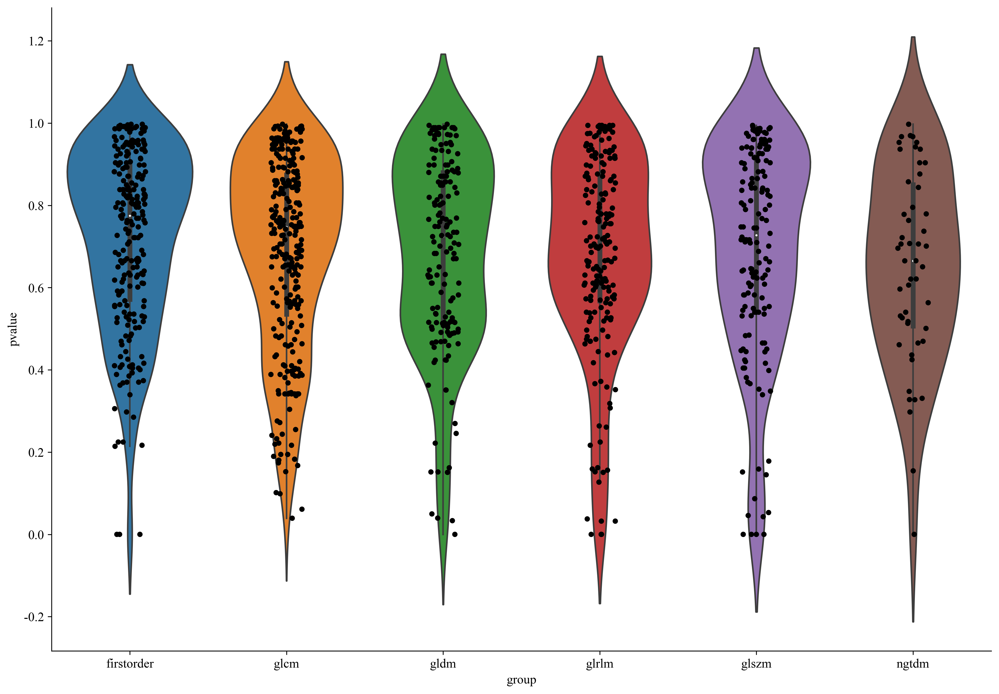

In [13]:
import matplotlib.pyplot as plt

def map2float(x):
    try:
        return float(str(x)[1:])
    except:
        return 1

stats[['pvalue']] = stats[['pvalue']].applymap(map2float)
stats[['group']] = stats[['feature_name']].applymap(lambda x: x.split('_')[-3])
stats = stats[['feature_name', 'pvalue', 'group']]
g = sns.catplot(x="group", y="pvalue", data=stats, kind="violin")
g.fig.set_size_inches(15,10)
sns.stripplot(x="group", y="pvalue", data=stats, ax=g.ax, color='black')
plt.savefig(f'img/{task_type}feature_stats.svg', bbox_inches = 'tight')

#### 调整pvalue进行筛选。

In [14]:
pvalue = get_param_in_cwd('p_value', 0.05)
sel_feature = list(stats[stats['pvalue'] < pvalue]['feature_name']) + labels + [group_info]
data = data[sel_feature]
data

,exponential_firstorder_MeanAbsoluteDeviation_SWE,gradient_gldm_LargeDependenceLowGrayLevelEmphasis_SWE,gradient_gldm_LowGrayLevelEmphasis_SWE,gradient_gldm_SmallDependenceLowGrayLevelEmphasis_SWE,gradient_glrlm_LongRunLowGrayLevelEmphasis_SWE,gradient_glrlm_LowGrayLevelRunEmphasis_SWE,gradient_glrlm_ShortRunLowGrayLevelEmphasis_SWE,gradient_glszm_LargeAreaHighGrayLevelEmphasis_SWE,gradient_glszm_LargeAreaLowGrayLevelEmphasis_SWE,gradient_glszm_LowGrayLevelZoneEmphasis_SWE,...,lbp_3D_m1_glrlm_LowGrayLevelRunEmphasis_SWE,logarithm_firstorder_90Percentile_SWE,logarithm_ngtdm_Contrast_SWE,original_firstorder_InterquartileRange_SWE,square_glszm_SmallAreaHighGrayLevelEmphasis_SWE,wavelet_HHH_glcm_Imc2_SWE,wavelet_HLH_glszm_LargeAreaEmphasis_SWE,wavelet_HLH_glszm_LargeAreaHighGrayLevelEmphasis_SWE,label,group
3,0.090,0.334,0.239,0.121,0.286,0.247,0.236,-1.348,0.383,0.285,...,0.379,-0.563,-0.307,-1.242,0.330,0.768,-0.932,-0.913,0,test
4,-0.625,0.164,0.589,0.694,0.525,0.584,0.602,0.320,0.343,0.573,...,0.379,1.125,-0.300,0.318,-0.498,-1.544,0.681,1.034,1,test
6,-1.014,-0.161,0.186,0.271,0.178,0.236,0.250,0.274,0.147,0.409,...,0.379,0.723,-0.290,-0.653,-1.196,-0.643,-0.267,-0.545,0,test
10,-0.434,1.207,0.526,0.301,0.664,0.527,0.489,-1.004,0.940,0.559,...,0.379,0.416,-0.307,-0.902,0.079,1.052,-0.539,-0.640,0,test
15,-0.163,0.386,0.855,0.934,0.804,0.862,0.876,1.753,0.572,0.866,...,0.379,1.691,-0.301,1.245,0.210,0.970,0.380,0.368,0,test
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
135,4.753,-1.091,-1.154,-1.013,-1.193,-1.166,-1.155,3.836,-1.228,-1.179,...,0.463,0.679,-0.256,6.256,3.218,1.172,-1.088,-1.134,1,train
137,0.191,0.139,0.934,1.212,0.823,0.986,1.027,1.338,0.512,1.138,...,-0.693,-0.193,0.061,-0.787,-0.357,-0.617,-1.056,-1.057,0,train
139,-0.501,0.066,0.485,0.643,0.441,0.515,0.541,-0.113,0.288,0.606,...,0.463,0.838,-0.261,-0.965,-0.556,-0.147,-0.007,-0.282,1,train
140,-0.392,-1.128,-1.168,-1.026,-1.194,-1.162,-1.149,2.240,-1.217,-1.118,...,-1.735,1.829,0.546,1.132,-0.129,1.550,0.067,0.499,0,train


### 相关系数

计算相关系数的方法有3种可供选择
1. pearson （皮尔逊相关系数）: standard correlation coefficient

2. kendall (肯德尔相关性系数) : Kendall Tau correlation coefficient

3. spearman (斯皮尔曼相关性系数): Spearman rank correlation

三种相关系数参考：https://blog.csdn.net/zmqsdu9001/article/details/82840332

In [15]:
# 相关系数视频
onekey_show('传统组学任务|相关系数')

[2025-10-13 20:34:24 - <frozen onekey_algo.custom.Manager>: 138]	INFO	播放视频功能已经设置成：Disable！


In [16]:
pearson_corr = data[data['group'] == 'train'][[c for c in data.columns if c not in labels]].corr('pearson')
# kendall_corr = data.corr('kendall')
# spearman_corr = data.corr('spearman')

### 相关系数可视化

通过修改变量名，可以可视化不同相关系数下的相关矩阵。

**注意**：当特征特别多的时候（大于100），尽量不要可视化，否则运行时间会特别长。

In [17]:
import seaborn as sns
from onekey_algo.custom.components.comp1 import draw_matrix
if data.shape[1] < 100:
    plt.figure(figsize=(50.0, 40.0))
    # 选择可视化的相关系数
    draw_matrix(pearson_corr, annot=True, cmap='YlGnBu', cbar=False)
    plt.savefig(f'img/{task_type}feature_corr.svg', bbox_inches = 'tight')

### 聚类分析

通过修改变量名，可以可视化不同相关系数下的相聚类分析矩阵。

注意：当特征特别多的时候（大于100），尽量不要可视化，否则运行时间会特别长。

In [18]:
import seaborn as sns
import matplotlib.pyplot as plt

if data.shape[1] < 100:
    pp = sns.clustermap(pearson_corr, linewidths=.5, figsize=(50.0, 40.0), cmap='YlGnBu')
    plt.setp(pp.ax_heatmap.get_yticklabels(), rotation=0)
    plt.savefig(f'img/{task_type}feature_cluster.svg', bbox_inches = 'tight')

### 特征筛选 -- 相关系数

根据相关系数，对于相关性比较高的特征（一般文献取corr>0.9），两者保留其一。

```python
def select_feature(corr, threshold: float = 0.9, keep: int = 1, topn=10, verbose=False):
    """
    * corr, 相关系数矩阵。
    * threshold，筛选的相关系数的阈值，大于阈值的两者保留其一（可以根据keep修改，可以是其二...）。默认阈值为0.9
    * keep，可以选择大于相关系数，保留几个，默认只保留一个。
    * topn, 每次去掉多少重复特征。
    * verbose，是否打印日志
    """
```

In [19]:
# 特征筛选视频
onekey_show('传统组学任务|特征筛选')

[2025-10-13 20:35:15 - <frozen onekey_algo.custom.Manager>: 138]	INFO	播放视频功能已经设置成：Disable！


In [20]:
from onekey_algo.custom.components.comp1 import select_feature, select_feature_mrmr
sel_feature = select_feature(pearson_corr, threshold=0.9, topn=128, verbose=False)
if get_param_in_cwd('mrmr_sel_feature_num', None) is not None:
    num_features = min(len(sel_feature), get_param_in_cwd('mrmr_sel_feature_num'))
    sel_feature = select_feature_mrmr(data[data['group'] == 'train'][sel_feature + labels], num_features=num_features)
sel_feature += labels + [group_info]
sel_feature

['exponential_firstorder_MeanAbsoluteDeviation_SWE',
 'gradient_glszm_LargeAreaHighGrayLevelEmphasis_SWE',
 'gradient_glszm_LargeAreaLowGrayLevelEmphasis_SWE',
 'gradient_glszm_LowGrayLevelZoneEmphasis_SWE',
 'lbp_3D_k_gldm_SmallDependenceLowGrayLevelEmphasis_SWE',
 'lbp_3D_m1_glrlm_LowGrayLevelRunEmphasis_SWE',
 'logarithm_firstorder_90Percentile_SWE',
 'logarithm_ngtdm_Contrast_SWE',
 'original_firstorder_InterquartileRange_SWE',
 'square_glszm_SmallAreaHighGrayLevelEmphasis_SWE',
 'wavelet_HHH_glcm_Imc2_SWE',
 'wavelet_HLH_glszm_LargeAreaHighGrayLevelEmphasis_SWE',
 'label',
 'group']

### 过滤特征

通过`sel_feature`过滤出筛选出来的特征。

In [21]:
sel_data = data[sel_feature]
sel_data.describe()

,exponential_firstorder_MeanAbsoluteDeviation_SWE,gradient_glszm_LargeAreaHighGrayLevelEmphasis_SWE,gradient_glszm_LargeAreaLowGrayLevelEmphasis_SWE,gradient_glszm_LowGrayLevelZoneEmphasis_SWE,lbp_3D_k_gldm_SmallDependenceLowGrayLevelEmphasis_SWE,lbp_3D_m1_glrlm_LowGrayLevelRunEmphasis_SWE,logarithm_firstorder_90Percentile_SWE,logarithm_ngtdm_Contrast_SWE,original_firstorder_InterquartileRange_SWE,square_glszm_SmallAreaHighGrayLevelEmphasis_SWE,wavelet_HHH_glcm_Imc2_SWE,wavelet_HLH_glszm_LargeAreaHighGrayLevelEmphasis_SWE,label
count,1.420e+02,1.420e+02,1.420e+02,1.420e+02,1.420e+02,1.420e+02,1.420e+02,1.420e+02,1.420e+02,1.420e+02,1.420e+02,1.420e+02,142.000
mean,-9.382e-17,1.314e-16,9.382e-17,-5.629e-17,-4.879e-16,-1.335e-15,3.440e-16,-2.971e-17,-7.193e-17,3.018e-16,1.689e-16,-1.501e-16,0.345
std,9.964e-01,9.964e-01,9.964e-01,9.964e-01,9.964e-01,9.964e-01,9.964e-01,9.964e-01,9.964e-01,9.964e-01,9.964e-01,9.964e-01,0.477
min,-1.121e+00,-1.525e+00,-1.641e+00,-1.612e+00,-8.419e-01,-4.308e+00,-2.072e+00,-3.069e-01,-1.502e+00,-1.408e+00,-2.048e+00,-1.315e+00,0.000
25%,-5.672e-01,-7.335e-01,-7.448e-01,-7.334e-01,-8.020e-01,3.795e-01,-6.716e-01,-2.733e-01,-6.718e-01,-6.996e-01,-7.228e-01,-6.691e-01,0.000
50%,-3.930e-01,-2.808e-01,-9.305e-02,-9.945e-02,-3.879e-01,4.633e-01,-1.960e-01,-2.721e-01,-8.147e-02,-2.742e-01,-7.869e-02,-2.595e-01,0.000
75%,2.143e-01,4.736e-01,5.738e-01,5.267e-01,4.476e-01,4.633e-01,6.909e-01,-2.537e-01,4.673e-01,4.463e-01,6.953e-01,3.616e-01,1.000
max,4.753e+00,3.836e+00,2.859e+00,3.192e+00,4.092e+00,4.633e-01,2.235e+00,7.860e+00,6.256e+00,3.779e+00,3.300e+00,4.656e+00,1.000


### 样本可视化

根据特征和label信息，将rad features降维到2维，看不同的label样本在二维空间的分布。

**注意**：由于特征空间维度极高，降维难免会有损失，所以二维的可视化仅供参考。

目前支持的:

| **降维方法** | **Method名称**                                                 |
| ------------ | ------------------------------------------------------------ |
| LLE      | Standard LLE, Modified LLE                                   |
| PCA      | t-SNE, NCA                                                      |
| SVD      | Truncated SVD                                              |
| Model Based      | Random projection, Isomap, MDS, Random Trees,Spectral       |

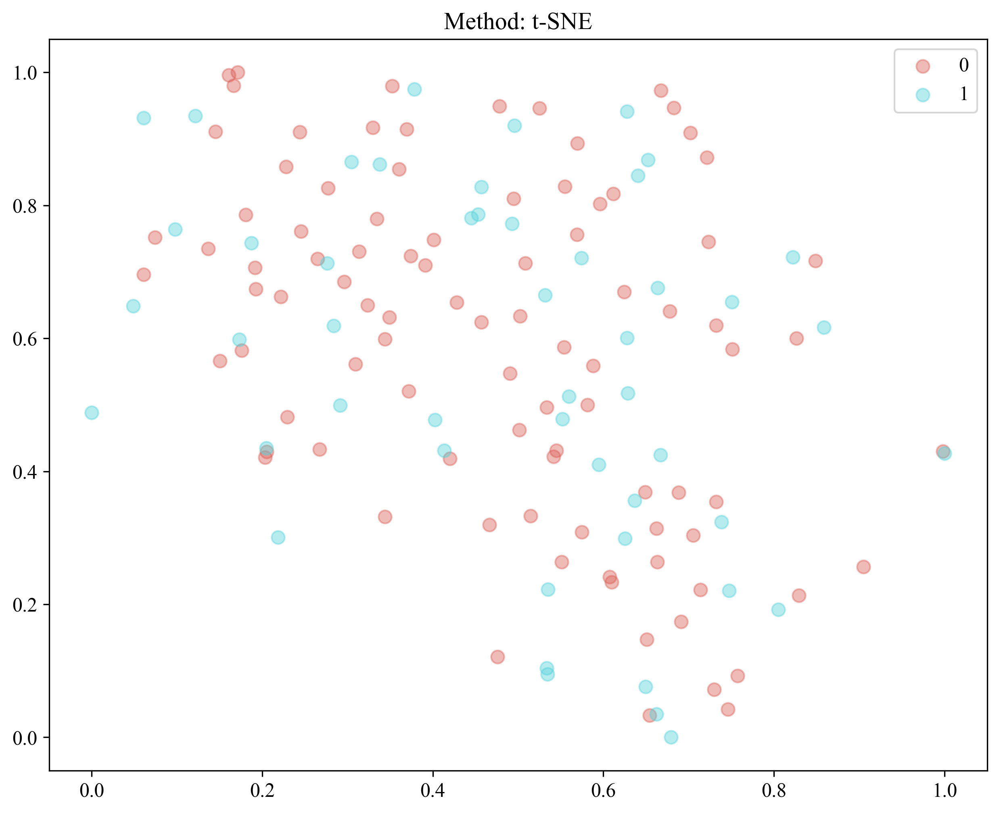

In [22]:
from onekey_algo.custom.components.comp1 import analysis_features
analysis_features(sel_data[sel_feature[:-2]], data[labels[0]], methods='t-SNE')

## 构建数据

将样本的训练数据X与监督信息y分离出来，并且对训练数据进行划分，一般的划分原则为80%-20%

In [23]:
import numpy as np
import onekey_algo.custom.components as okcomp

n_classes = 2
train_data = sel_data[(sel_data[group_info] == 'train')]
train_ids = ids[train_data.index]
train_data = train_data.reset_index()
train_data = train_data.drop('index', axis=1)
y_data = train_data[labels]
X_data = train_data.drop(labels + [group_info], axis=1)

test_data = sel_data[sel_data[group_info] != 'train']
test_ids = ids[test_data.index]
test_data = test_data.reset_index()
test_data = test_data.drop('index', axis=1)
y_test_data = test_data[labels]
X_test_data = test_data.drop(labels + [group_info], axis=1)

y_all_data = sel_data[labels]
X_all_data = sel_data.drop(labels + [group_info], axis=1)

column_names = X_data.columns
print(f"训练集样本数：{X_data.shape}, 验证集样本数：{X_test_data.shape}")

训练集样本数：(102, 12), 验证集样本数：(40, 12)


### Lasso

初始化Lasso模型，alpha为惩罚系数。具体的参数文档可以参考：[文档](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.Lasso.html?highlight=lasso#sklearn.linear_model.Lasso)

### 交叉验证

不同Lambda下的，特征的的权重大小。
```python
def lasso_cv_coefs(X_data, y_data, points=50, column_names: List[str] = None, **kwargs):
    """

    Args:
        X_data: 训练数据
        y_data: 监督数据
        points: 打印多少个点。默认50
        column_names: 列名，默认为None，当选择的数据很多的时候，建议不要添加此参数
        **kwargs: 其他用于打印控制的参数。

    """
 ```

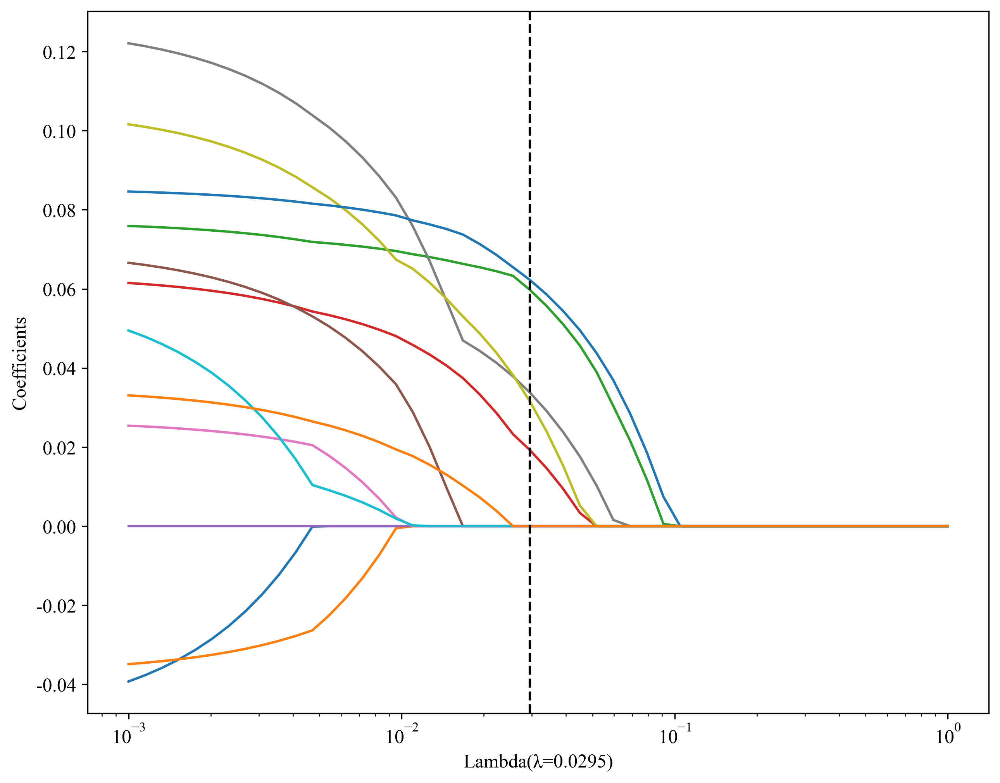

In [24]:
alpha = okcomp.comp1.lasso_cv_coefs(X_data, y_data, column_names=None)
plt.savefig(f'img/{task_type}feature_lasso.svg', bbox_inches = 'tight')

### 模型效能

```python
def lasso_cv_efficiency(X_data, y_data, points=50, **kwargs):
    """

    Args:
        Xdata: 训练数据
        ydata: 测试数据
        points: 打印的数据密度
        **kwargs: 其他的图像样式
            # 数据点标记, fmt="o"
            # 数据点大小, ms=3
            # 数据点颜色, mfc="r"
            # 数据点边缘颜色, mec="r"
            # 误差棒颜色, ecolor="b"
            # 误差棒线宽, elinewidth=2
            # 误差棒边界线长度, capsize=2
            # 误差棒边界厚度, capthick=1
    Returns:
    """
 ```

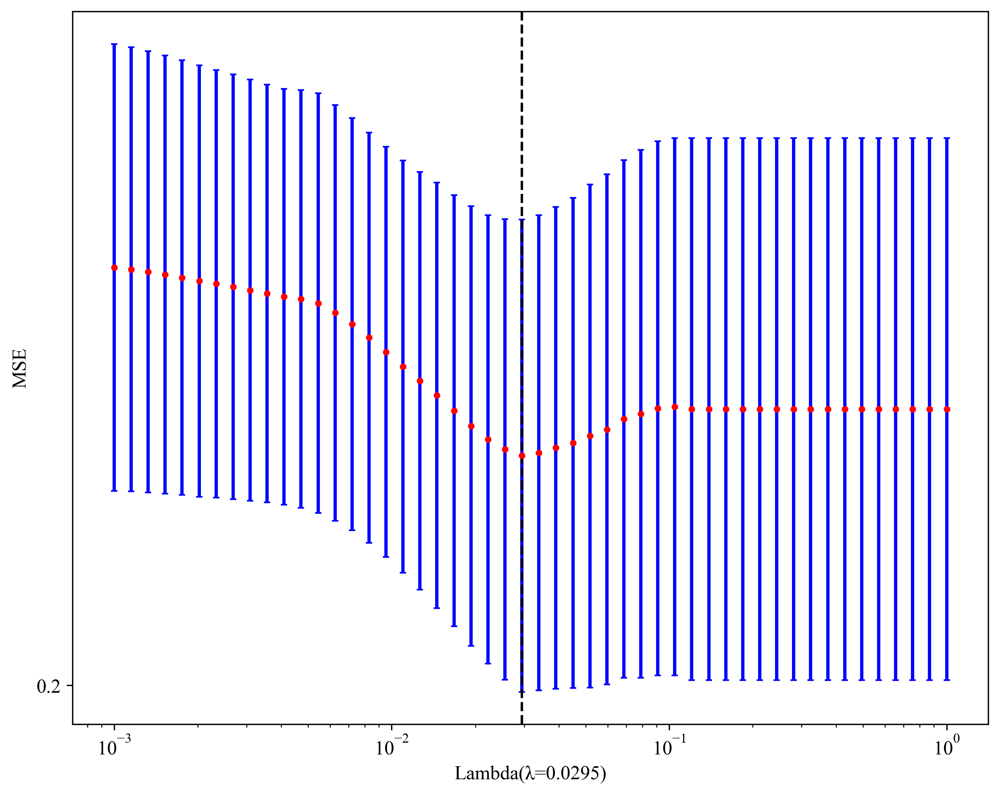

In [25]:
okcomp.comp1.lasso_cv_efficiency(X_data, y_data, points=50)
plt.savefig(f'img/{task_type}feature_mse.svg', bbox_inches = 'tight')

### 惩罚系数

使用交叉验证的惩罚系数作为模型训练的基础。

In [26]:
from sklearn import linear_model

models = []
for label in labels:
    clf = linear_model.Lasso(alpha=alpha)
    clf.fit(X_data, y_data[label])
    models.append(clf)

### 特征筛选

筛选出其中coef > 0的特征。并且打印出相应的公式。

In [27]:
COEF_THRESHOLD = 1e-6 # 筛选的特征阈值
scores = []
selected_features = []
for label, model in zip(labels, models):
    feat_coef = [(feat_name, coef) for feat_name, coef in zip(column_names, model.coef_) 
                 if COEF_THRESHOLD is None or abs(coef) > COEF_THRESHOLD]
    selected_features.append([feat for feat, _ in feat_coef])
    formula = ' '.join([f"{coef:+.6f} * {feat_name}" for feat_name, coef in feat_coef])
    score = f"{label} = {model.intercept_} {'+' if formula[0] != '-' else ''} {formula}"
    scores.append(score)
    
print(scores[0])

label = 0.37254901960784315 + +0.059763 * gradient_glszm_LargeAreaLowGrayLevelEmphasis_SWE +0.019268 * gradient_glszm_LowGrayLevelZoneEmphasis_SWE +0.033811 * logarithm_ngtdm_Contrast_SWE +0.031598 * original_firstorder_InterquartileRange_SWE +0.062273 * wavelet_HHH_glcm_Imc2_SWE


### 特征权重

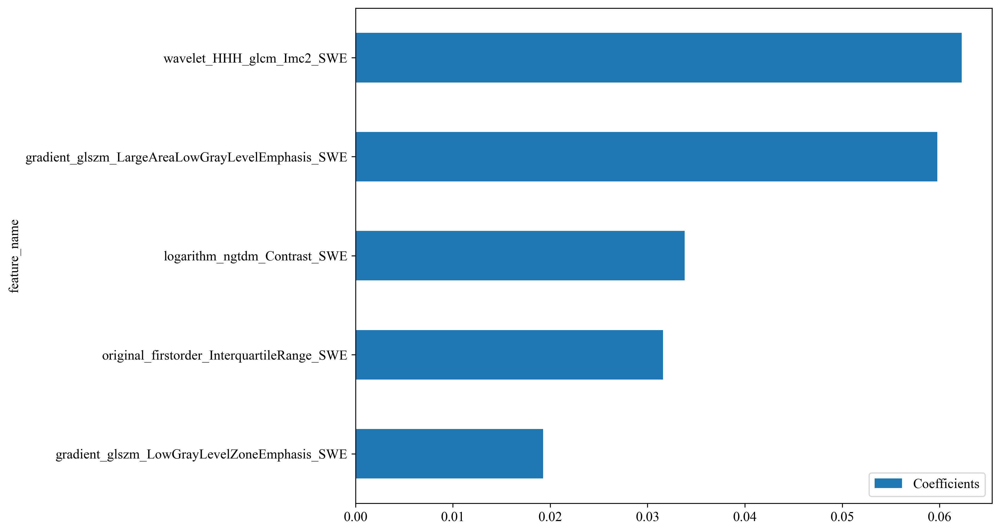

In [28]:
feat_coef = sorted(feat_coef, key=lambda x: x[1])
feat_coef_df = pd.DataFrame(feat_coef, columns=['feature_name', 'Coefficients'])
feat_coef_df.plot(x='feature_name', y='Coefficients', kind='barh')

plt.savefig(f'img/{task_type}feature_weights.svg', bbox_inches = 'tight')

### 进一步筛选特征

使用Lasso筛选出来的Coefficients比较高的特征作为训练数据。

In [29]:
X_data = X_data[selected_features[0]]
X_test_data = X_test_data[selected_features[0]]
X_data.columns

Index(['gradient_glszm_LargeAreaLowGrayLevelEmphasis_SWE',
       'gradient_glszm_LowGrayLevelZoneEmphasis_SWE',
       'logarithm_ngtdm_Contrast_SWE',
       'original_firstorder_InterquartileRange_SWE',
       'wavelet_HHH_glcm_Imc2_SWE'],
      dtype='object')

## 模型筛选

根据筛选出来的数据，做模型的初步选择。当前主要使用到的是Onekey中的

1. SVM，支持向量机，引用参考。
2. KNN，K紧邻，引用参考。
3. Decision Tree，决策树，引用参考。
4. Random Forests, 随机森林，引用参考。
5. XGBoost, bosting方法。引用参考。
6. LightGBM, bosting方法，引用参考。

In [30]:
model_names = get_param_in_cwd('ml_models')
models = okcomp.comp1.create_clf_model_none_overfit(model_names)
model_names = list(models.keys())

### 交叉验证

`n_trails`指定随机次数，每次采用的是80%训练，随机20%进行测试，找到最好的模型，以及对应的最好的数据划分。


```python
def get_bst_split(X_data: pd.DataFrame, y_data: pd.DataFrame,
            models: dict, test_size=0.2, metric_fn=accuracy_score, n_trails=10,
            cv: bool = False, shuffle: bool = False, metric_cut_off: float = None, random_state=None):
    """
    寻找数据集中最好的数据划分。
    Args:
        X_data: 训练数据
        y_data: 监督数据
        models: 模型名称，Dict类型、
        test_size: 测试集比例，只有当cv=False时生效
        metric_fn: 评价模型好坏的函数，默认准确率，可选roc_auc_score。
        n_trails: 尝试多少次寻找最佳数据集划分。
        cv: 是否是交叉验证，默认是False，当为True时，n_trails为交叉验证的n_fold
        shuffle: 是否进行随机打乱
        metric_cut_off: 当metric_fn的值达到多少时进行截断。
        random_state: 随机种子

    Returns: {'max_idx': max_idx, "max_model": max_model, "max_metric": max_metric, "results": results}

    """
```

**注意：这里采用了【挑数据】，如果想要严谨，请修改`n_trails=1`。**

[2025-10-13 20:35:24 - <frozen onekey_algo.custom.components.comp1>: 488]	WARNING	当cv=True的时候，采用的是交叉验证的模式，此时test_size的参数是不生效的，我们将忽略这个test_size设置。如果需要手动指定测试集比例，请修改cv=False。


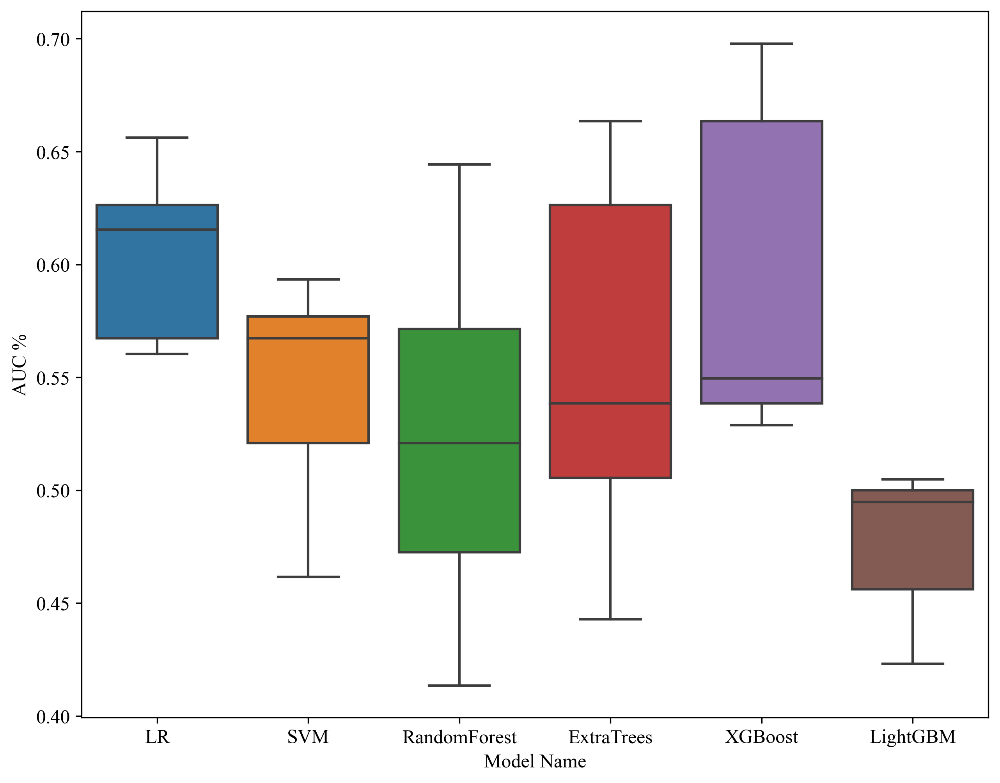

In [31]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.metrics import accuracy_score, roc_auc_score

# 随机使用n_trails次数据划分，找到最好的一次划分方法，并且保存在results中。
results = okcomp.comp1.get_bst_split(X_data, y_data, models, test_size=0.2, metric_fn=roc_auc_score, n_trails=5, cv=True, random_state=0)
_, (X_train_sel, X_test_sel, y_train_sel, y_test_sel) = results['results'][results['max_idx']]
X_train_sel, X_test_sel, y_train_sel, y_test_sel = X_data, X_test_data, y_data, y_test_data
trails, _ = zip(*results['results'])
cv_results = pd.DataFrame(trails, columns=model_names)
# 可视化每个模型在不同的数据划分中的效果。
sns.boxplot(data=cv_results)
plt.ylabel('AUC %')
plt.xlabel('Model Name')
plt.savefig(f'img/{task_type}model_cv.svg', bbox_inches = 'tight')

## 模型筛选

使用最好的数据划分，进行后续的模型研究。

**注意**: 一般情况下论文使用的是随机划分的数据，但也有些论文使用【刻意】筛选的数据划分。

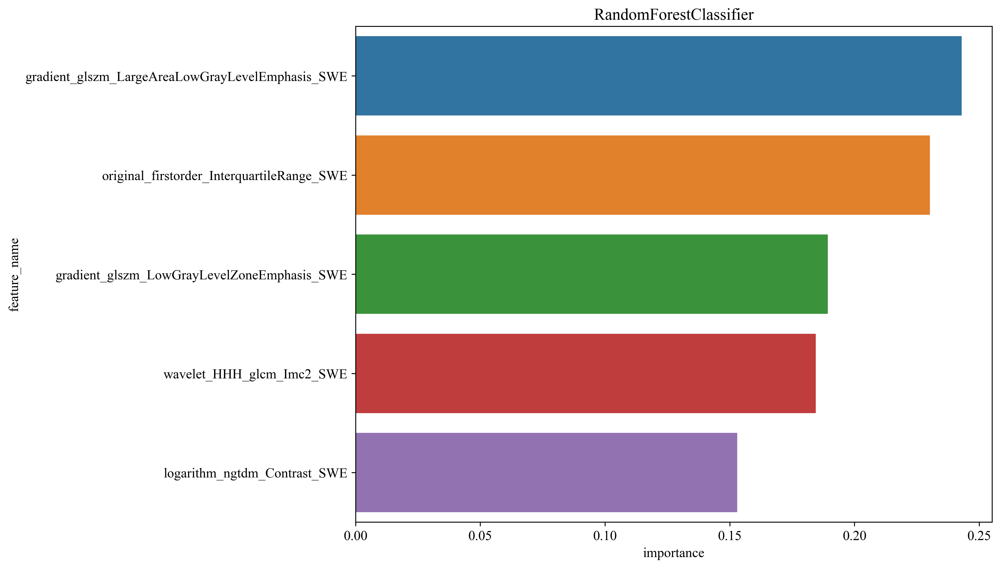

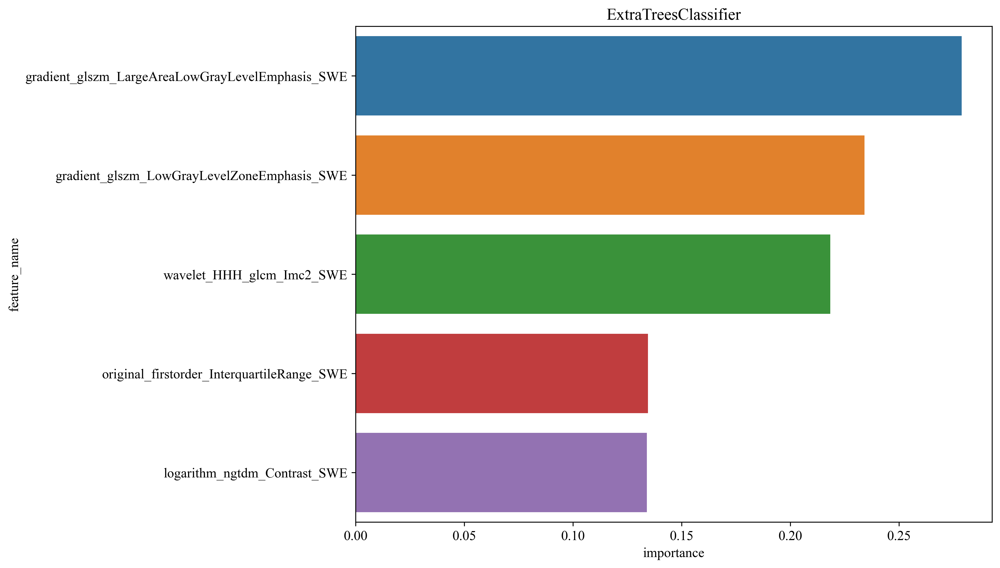

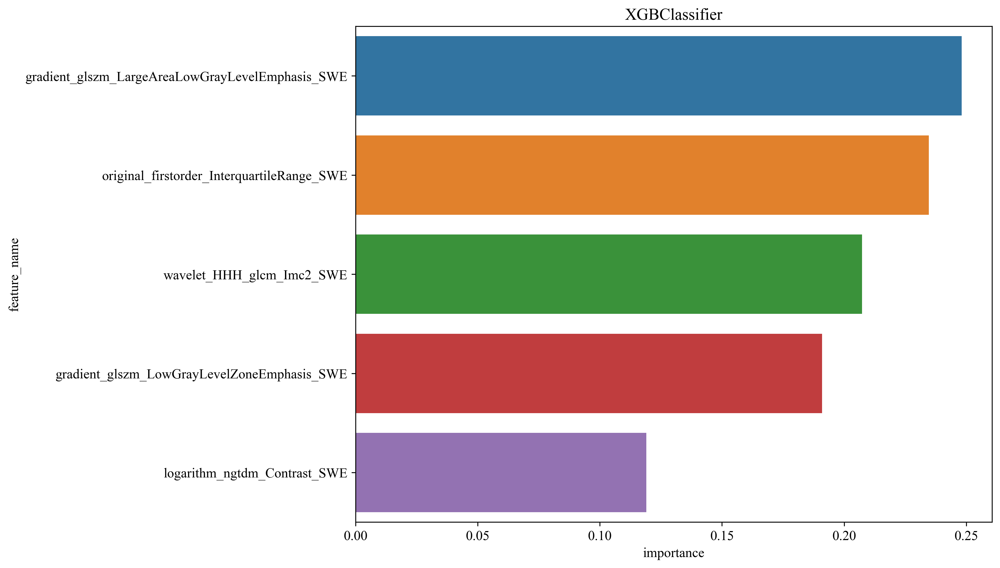

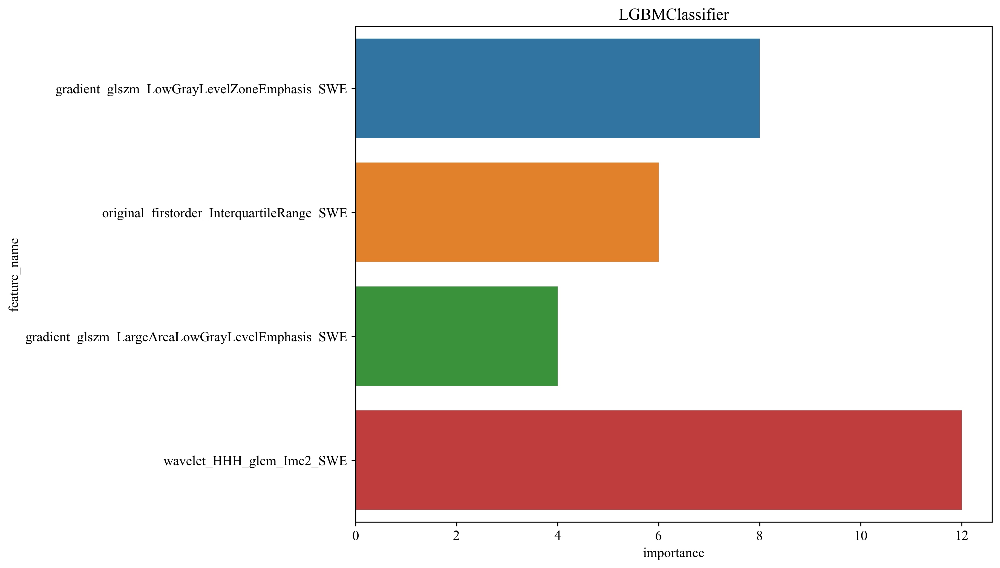

In [32]:
import joblib
from onekey_algo.custom.components.comp1 import plot_feature_importance, plot_learning_curve, smote_resample
targets = []
os.makedirs('models', exist_ok=True)
for l in labels:
    new_models = list(okcomp.comp1.create_clf_model_none_overfit(model_names).values())
    for mn, m in zip(model_names, new_models):
        X_train_smote, y_train_smote = X_train_sel, y_train_sel
        # 取消下一行的注释可以使用Smote进行采样，解决样本不均衡的问题。
        if get_param_in_cwd('use_smote', False):
            X_train_smote, y_train_smote = smote_resample(X_train_sel, y_train_sel)
        m.fit(X_train_smote, y_train_smote[l])
        # 保存训练的模型
        joblib.dump(m, f'models/{task_type}{mn}_{l}.pkl') 
        # 输出模型特征重要性，只针对高级树模型有用
        plot_feature_importance(m, selected_features[0], save_dir='img')
#         plot_learning_curve(m, X_train_sel, y_train_sel, title=f'Learning Curve {mn}')
#         plt.savefig(f"img/Rad_{mn}_learning_curve.svg", bbox_inches='tight')
        plt.show()
    targets.append(new_models)

## 预测结果

* predictions，二维数据，每个label对应的每个模型的预测结果。
* pred_scores，二维数据，每个label对应的每个模型的预测概率值。

In [33]:
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import OneHotEncoder
from onekey_algo.custom.components.delong import calc_95_CI
from onekey_algo.custom.components.metrics import analysis_pred_binary

predictions = [[(model.predict(X_train_sel), model.predict(X_test_sel)) 
                for model in target] for label, target in zip(labels, targets)]
pred_scores = [[(model.predict_proba(X_train_sel), model.predict_proba(X_test_sel)) 
                for model in target] for label, target in zip(labels, targets)]

metric = []
pred_sel_idx = []
for label, prediction, scores in zip(labels, predictions, pred_scores):
    pred_sel_idx_label = []
    for mname, (train_pred, test_pred), (train_score, test_score) in zip(model_names, prediction, scores):
        # 计算训练集指数
        acc, auc, ci, tpr, tnr, ppv, npv, precision, recall, f1, thres = analysis_pred_binary(y_train_sel[label], 
                                                                                              train_score[:, 1])
        ci = f"{ci[0]:.4f} - {ci[1]:.4f}"
        metric.append((mname, acc, auc, ci, tpr, tnr, ppv, npv, precision, recall, f1, thres, f"{label}-train"))
                 
        # 计算验证集指标
        acc, auc, ci, tpr, tnr, ppv, npv, precision, recall, f1, thres = analysis_pred_binary(y_test_sel[label], 
                                                                                              test_score[:, 1])
        ci = f"{ci[0]:.4f} - {ci[1]:.4f}"
        metric.append((mname, acc, auc, ci, tpr, tnr, ppv, npv, precision, recall, f1, thres, f"{label}-test"))
        # 计算thres对应的sel idx
        pred_sel_idx_label.append(np.logical_or(test_score[:, 0] >= thres, test_score[:, 1] >= thres))
    
    pred_sel_idx.append(pred_sel_idx_label)
metric = pd.DataFrame(metric, index=None, columns=['model_name', 'Accuracy', 'AUC', '95% CI',
                                                   'Sensitivity', 'Specificity', 
                                                   'PPV', 'NPV', 'Precision', 'Recall', 'F1',
                                                   'Threshold', 'Task'])
metric

,model_name,Accuracy,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Threshold,Task
0,LR,0.529,0.670,0.5635 - 0.7762,0.974,0.266,0.440,0.944,0.440,0.974,0.607,0.237,label-train
1,LR,0.450,0.589,0.4009 - 0.7778,0.818,0.310,0.310,0.818,0.310,0.818,0.450,0.286,label-test
2,SVM,0.696,0.757,0.6524 - 0.8616,0.789,0.641,0.566,0.837,0.566,0.789,0.659,0.348,label-train
3,SVM,0.650,0.436,0.2228 - 0.6487,0.182,0.828,0.286,0.727,0.286,0.182,0.222,0.376,label-test
4,RandomForest,0.824,0.889,0.8236 - 0.9552,0.816,0.828,0.738,0.883,0.738,0.816,0.775,0.459,label-train
5,RandomForest,0.325,0.381,0.1935 - 0.5682,0.909,0.103,0.278,0.750,0.278,0.909,0.426,0.206,label-test
6,ExtraTrees,0.765,0.827,0.7466 - 0.9080,0.474,0.937,0.818,0.750,0.818,0.474,0.600,0.409,label-train
7,ExtraTrees,0.425,0.541,0.3389 - 0.7426,0.818,0.276,0.300,0.800,0.300,0.818,0.439,0.330,label-test
8,XGBoost,0.951,0.989,0.9731 - 1.0000,0.921,0.969,0.946,0.954,0.946,0.921,0.933,0.514,label-train
9,XGBoost,0.375,0.495,0.2910 - 0.6996,0.818,0.207,0.281,0.750,0.281,0.818,0.419,0.157,label-test


### 绘制曲线

绘制的不同模型的准确率柱状图和折线图曲线。

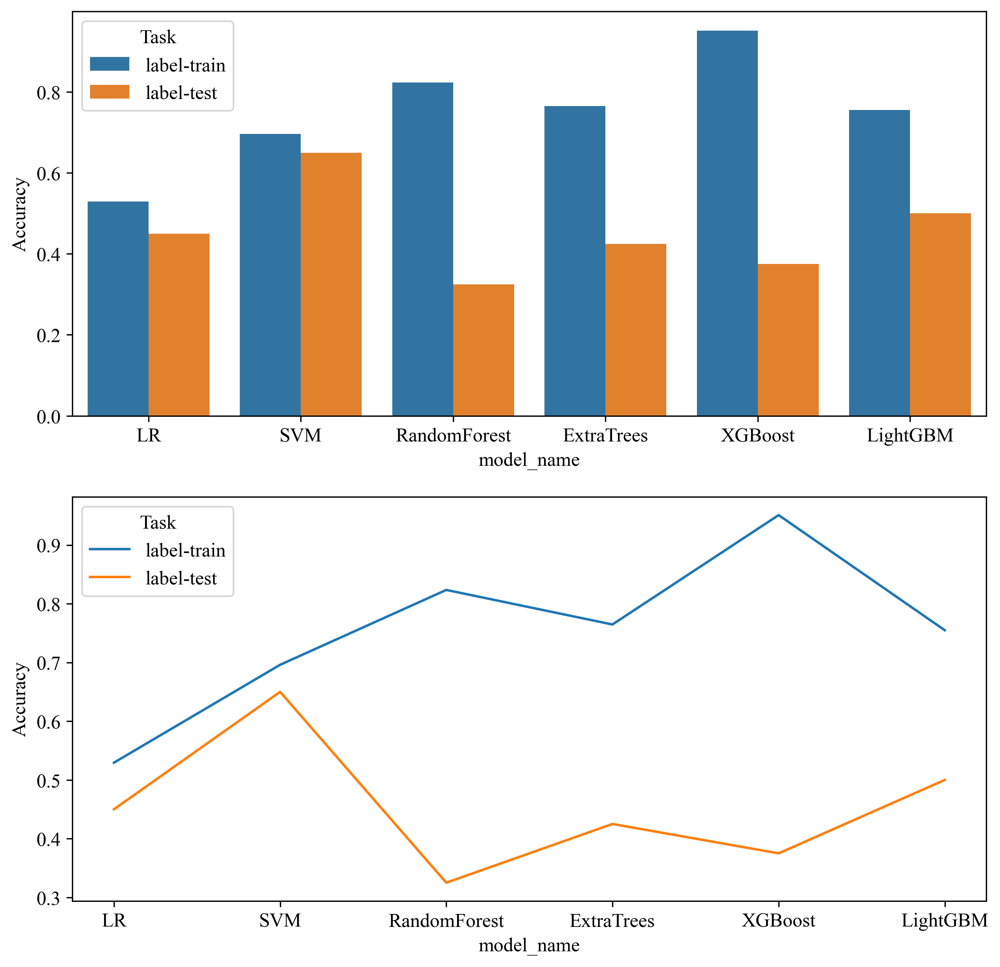

In [34]:
import seaborn as sns

plt.figure(figsize=(10, 10))
plt.subplot(211)
sns.barplot(x='model_name', y='Accuracy', data=metric, hue='Task')
plt.subplot(212)
sns.lineplot(x='model_name', y='Accuracy', data=metric, hue='Task')
plt.savefig(f'img/{task_type}model_acc.svg', bbox_inches = 'tight')

### 绘制ROC曲线
确定最好的模型，并且绘制曲线。

```python
def draw_roc(y_test, y_score, title='ROC', labels=None):
```

`sel_model = ['SVM', 'KNN']`参数为想要绘制的模型对应的参数。

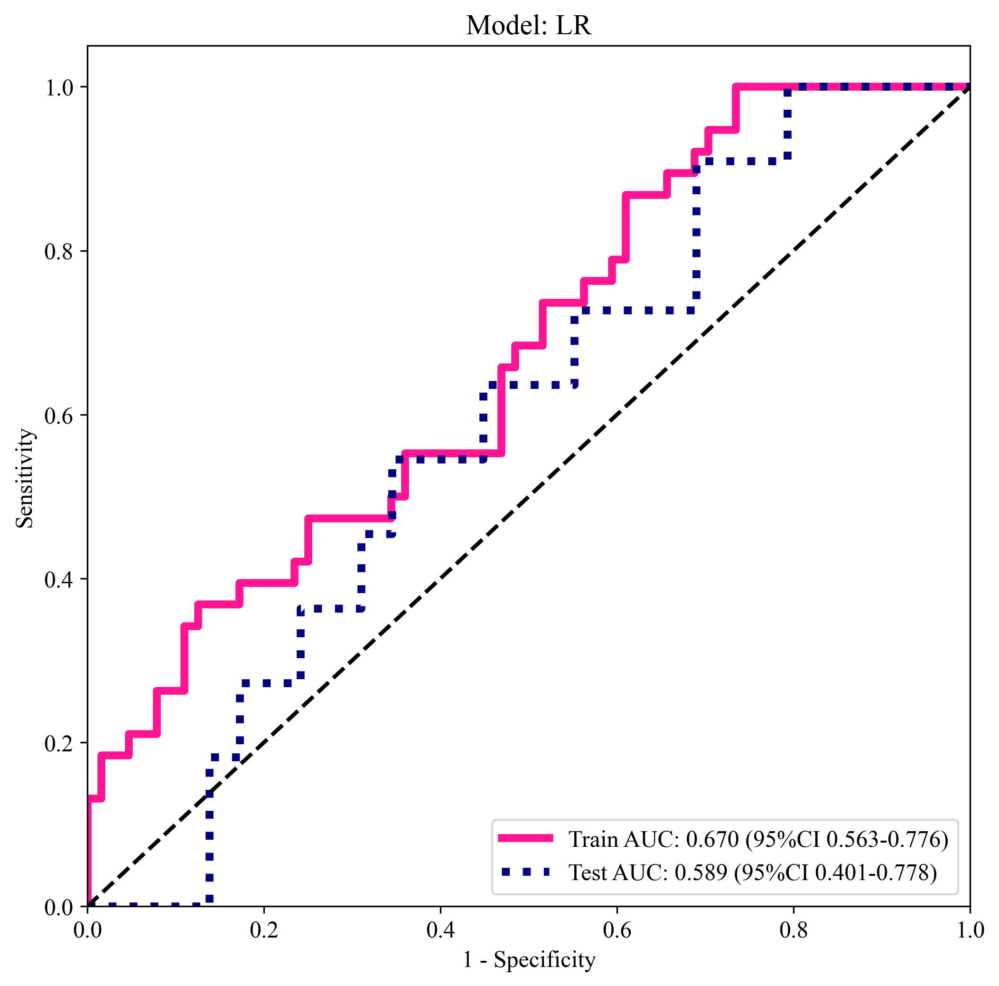

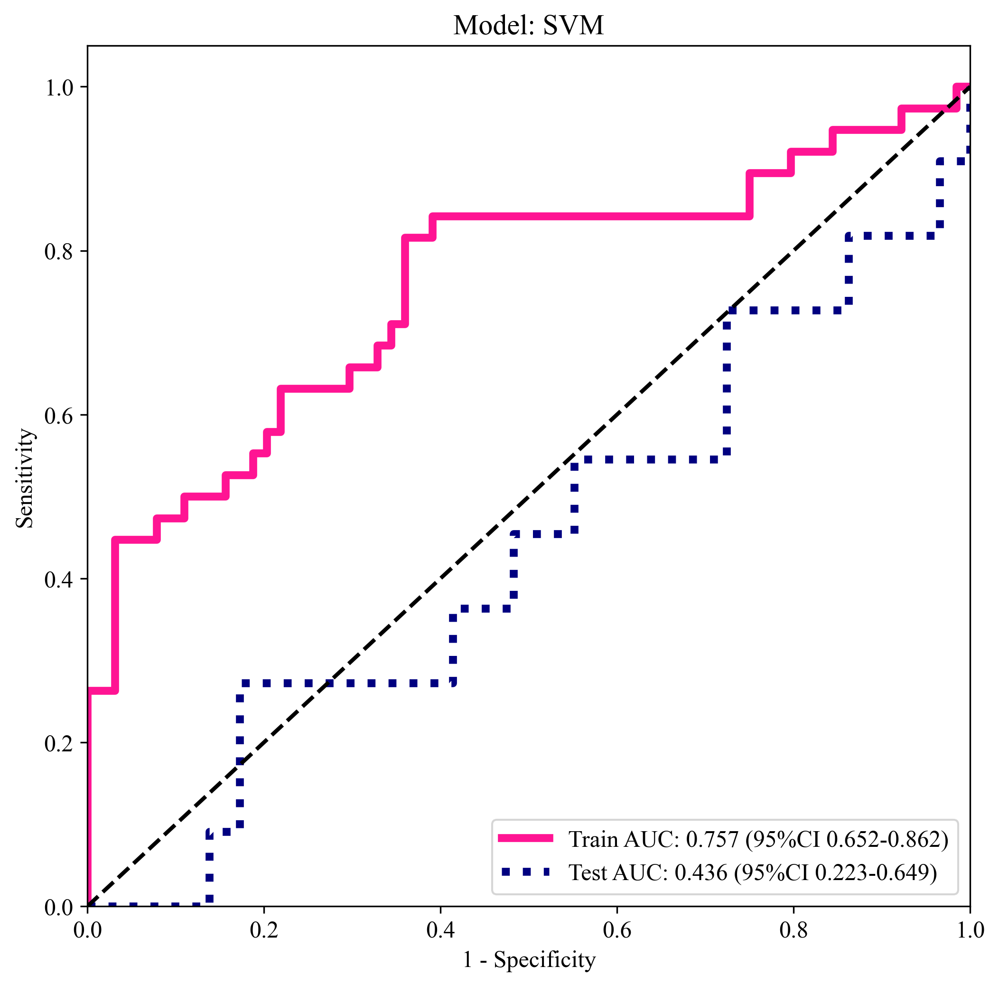

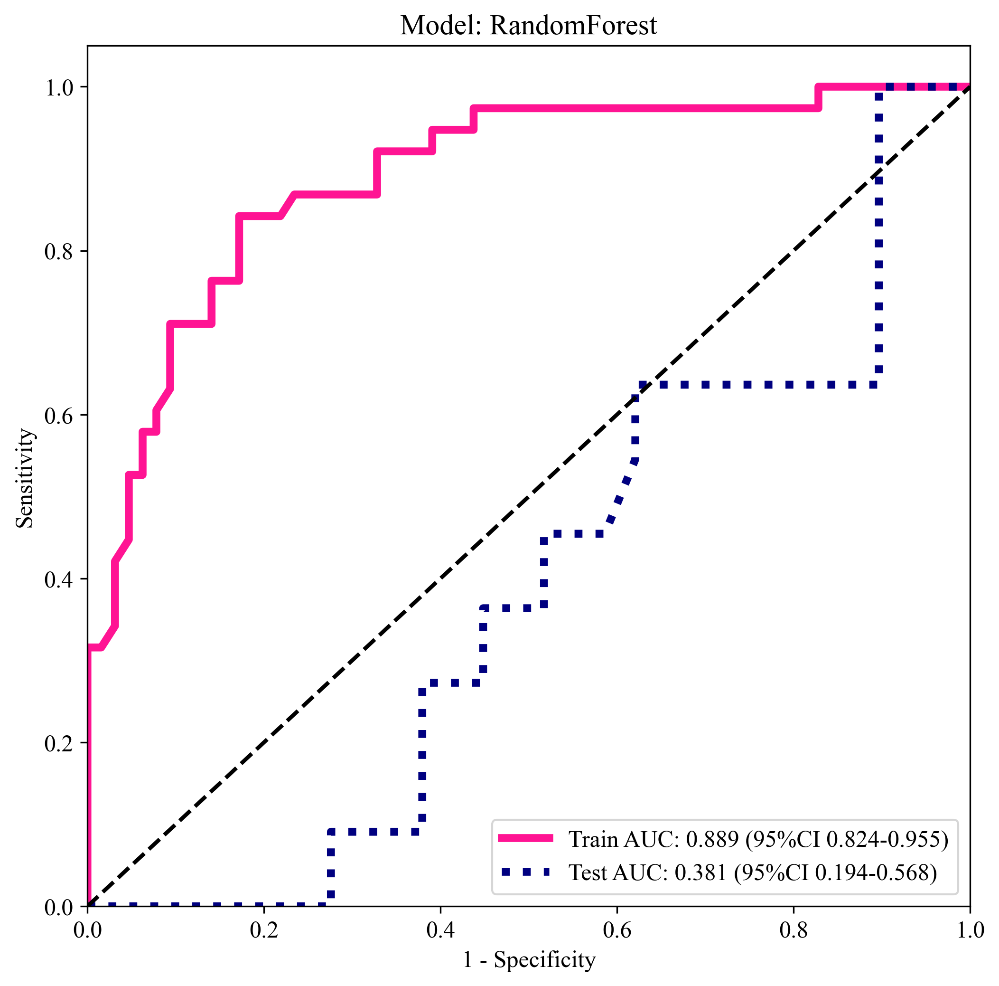

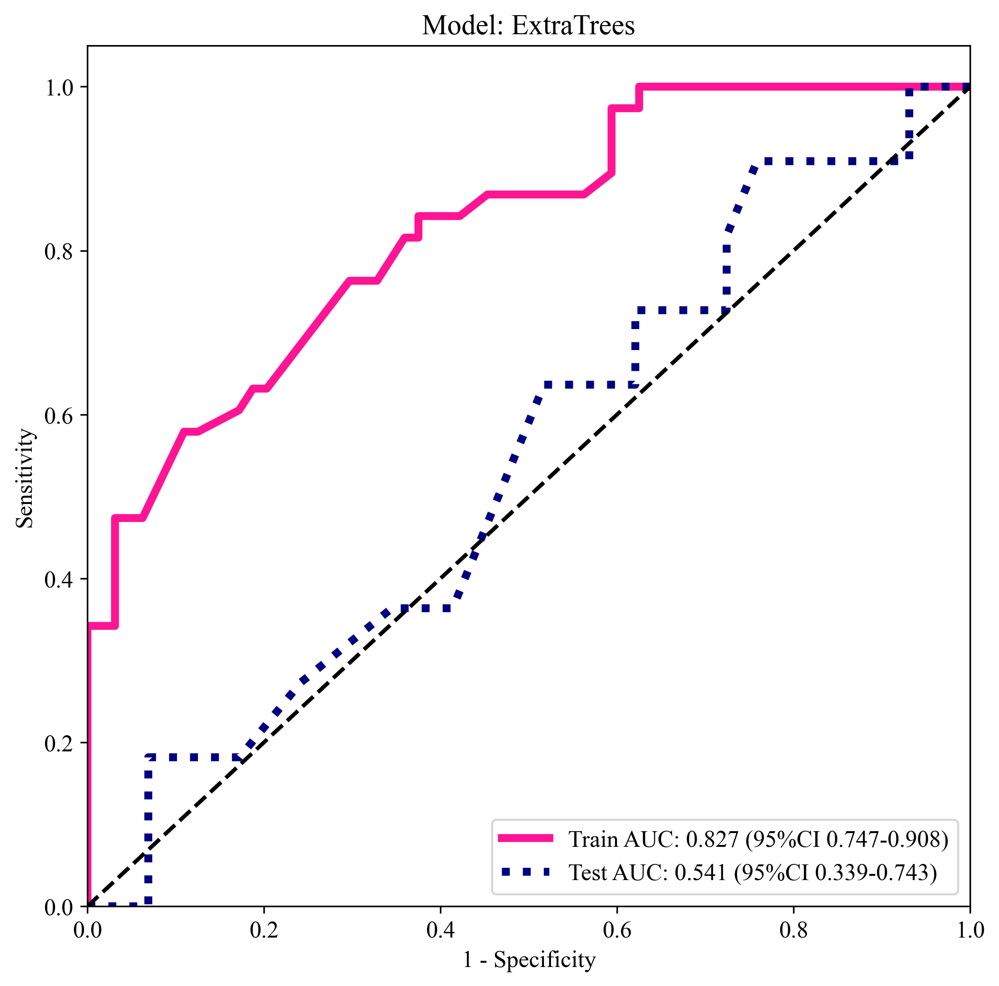

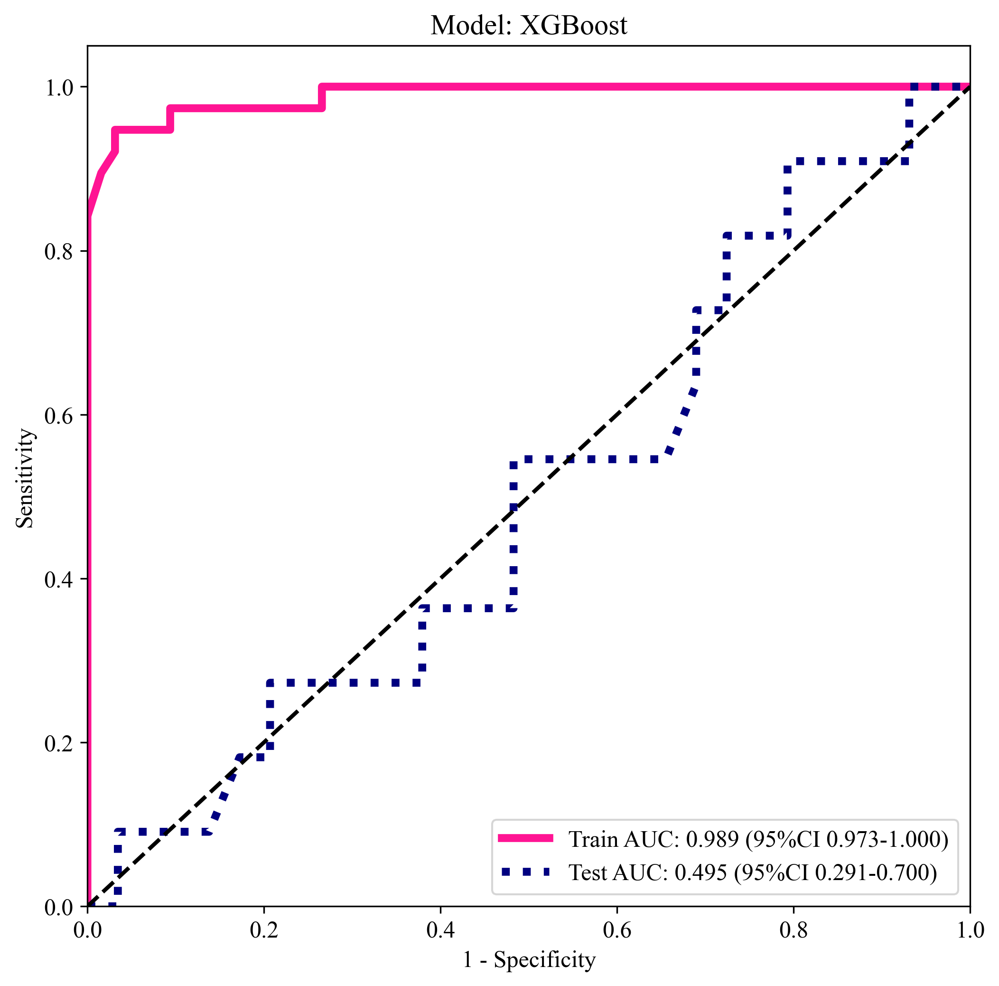

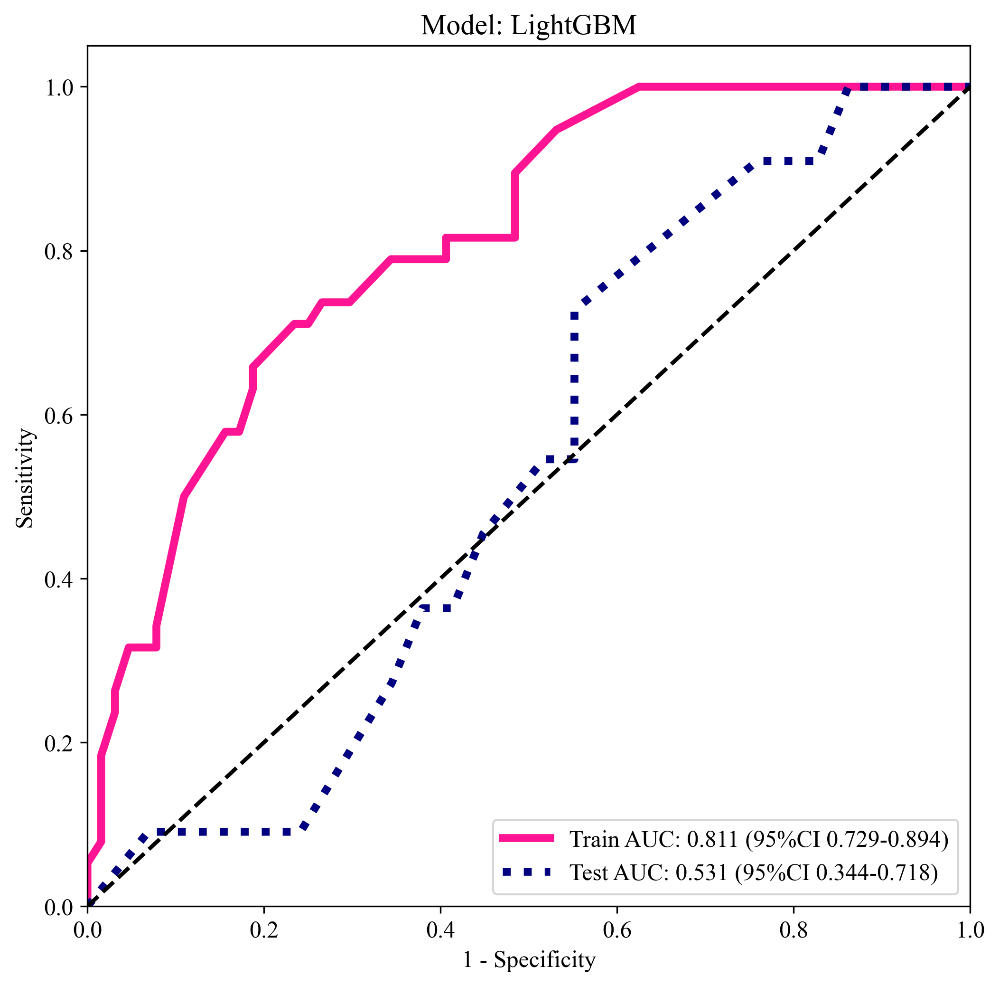

In [35]:
sel_model = model_names

for sm in sel_model:
    if sm in model_names:
        sel_model_idx = model_names.index(sm)
    
        # Plot all ROC curves
        plt.figure(figsize=(8, 8))
        for pred_score, label in zip(pred_scores, labels):
            okcomp.comp1.draw_roc([np.array(y_train_sel[label]), np.array(y_test_sel[label])], 
                                  pred_score[sel_model_idx], 
                                  labels=['Train', 'Test'], title=f"Model: {sm}")
            plt.savefig(f'img/{task_type}model_{sm}_roc.svg', bbox_inches = 'tight')

#### 汇总所有模型

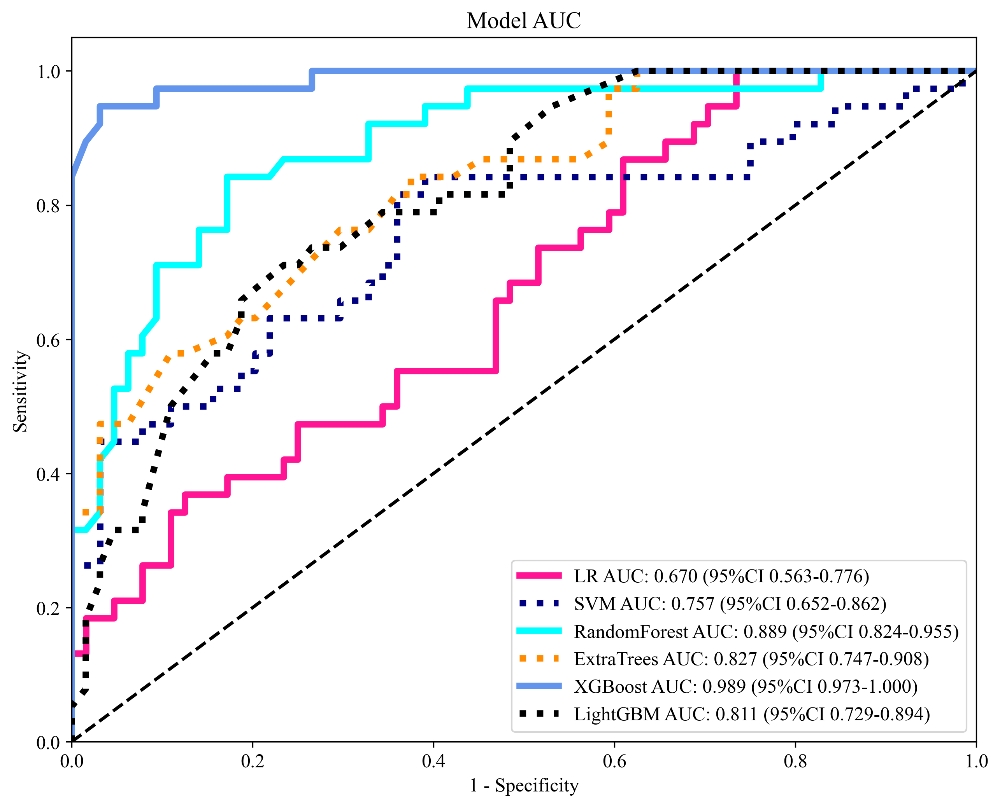

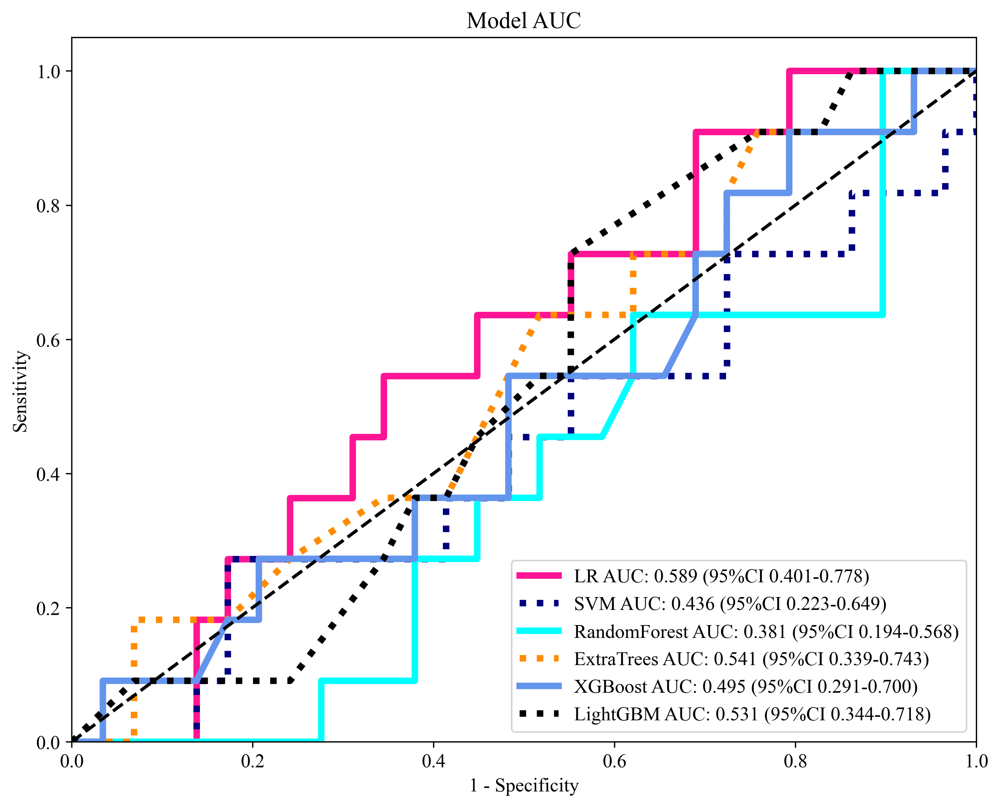

In [36]:
sel_model = model_names

for pred_score, label in zip(pred_scores, labels):
    pred_test_scores = []
    for sm in sel_model:
        if sm in model_names:
            sel_model_idx = model_names.index(sm)
            pred_test_scores.append(pred_score[sel_model_idx][0])
    okcomp.comp1.draw_roc([np.array(y_train_sel[label])] * len(pred_test_scores), 
                          pred_test_scores, 
                          labels=sel_model, title=f"Model AUC")
    plt.savefig(f'img/{task_type}model_roc_train.svg', bbox_inches = 'tight')
    plt.show()

for pred_score, label in zip(pred_scores, labels):
    pred_test_scores = []
    for sm in sel_model:
        if sm in model_names:
            sel_model_idx = model_names.index(sm)
            pred_test_scores.append(pred_score[sel_model_idx][1])
    okcomp.comp1.draw_roc([np.array(y_test_sel[label])] * len(pred_test_scores), 
                          pred_test_scores, 
                          labels=sel_model, title=f"Model AUC")
    plt.savefig(f'img/{task_type}model_roc_test.svg', bbox_inches = 'tight')

### DCA 决策曲线

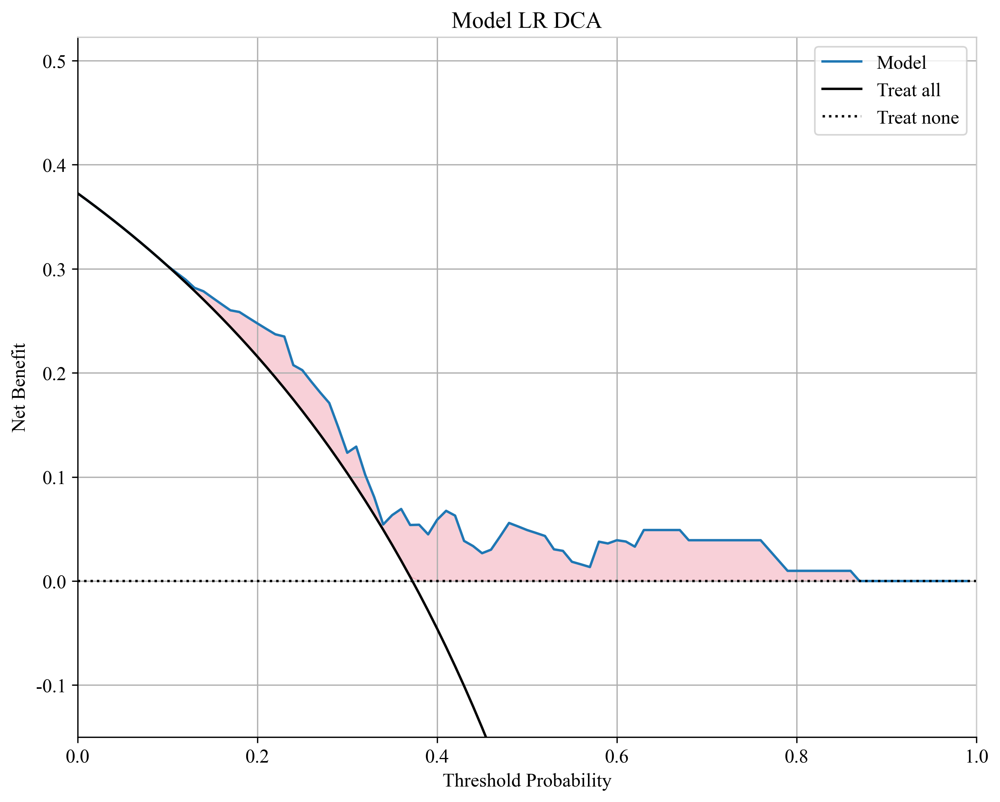

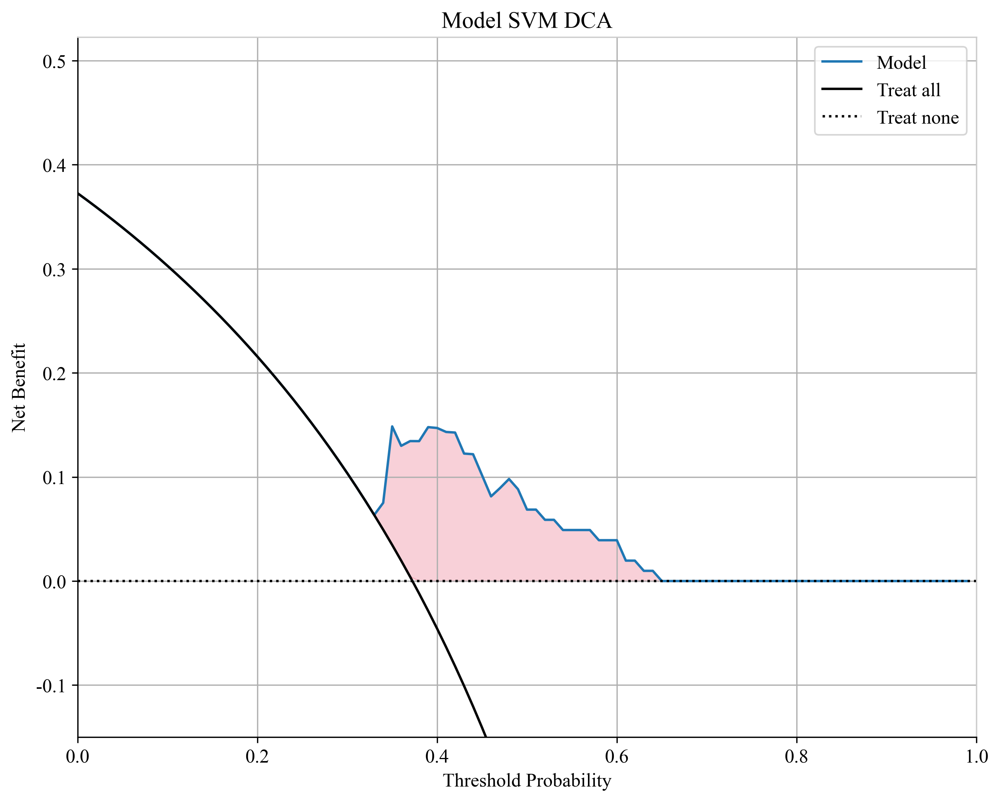

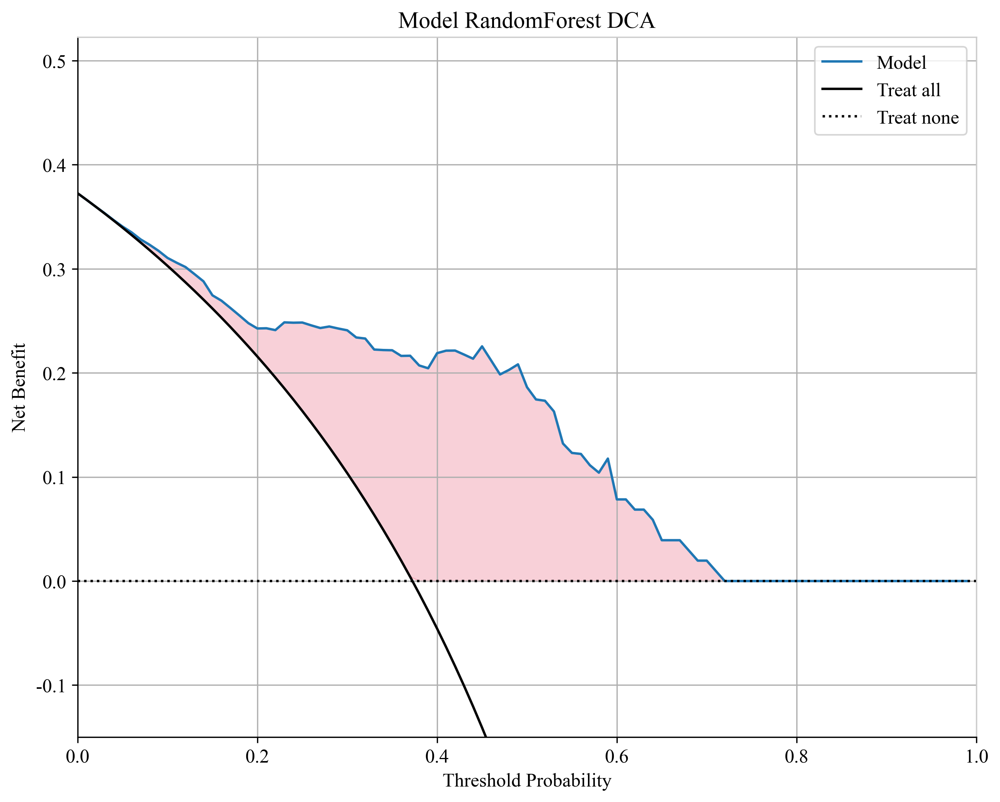

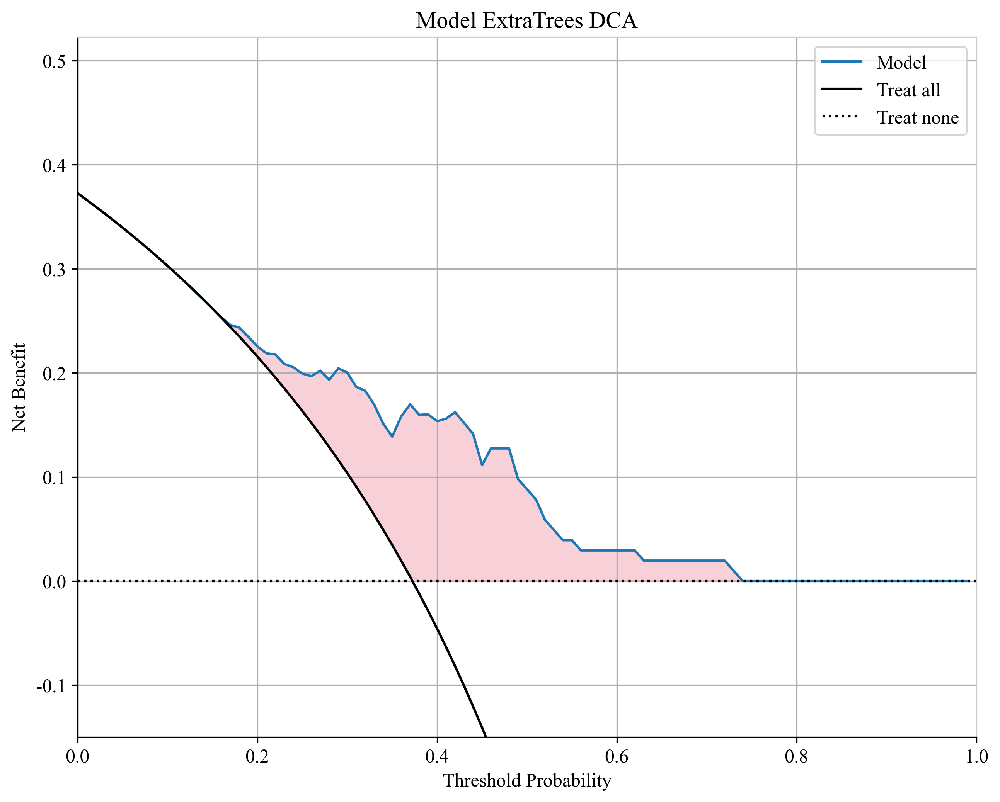

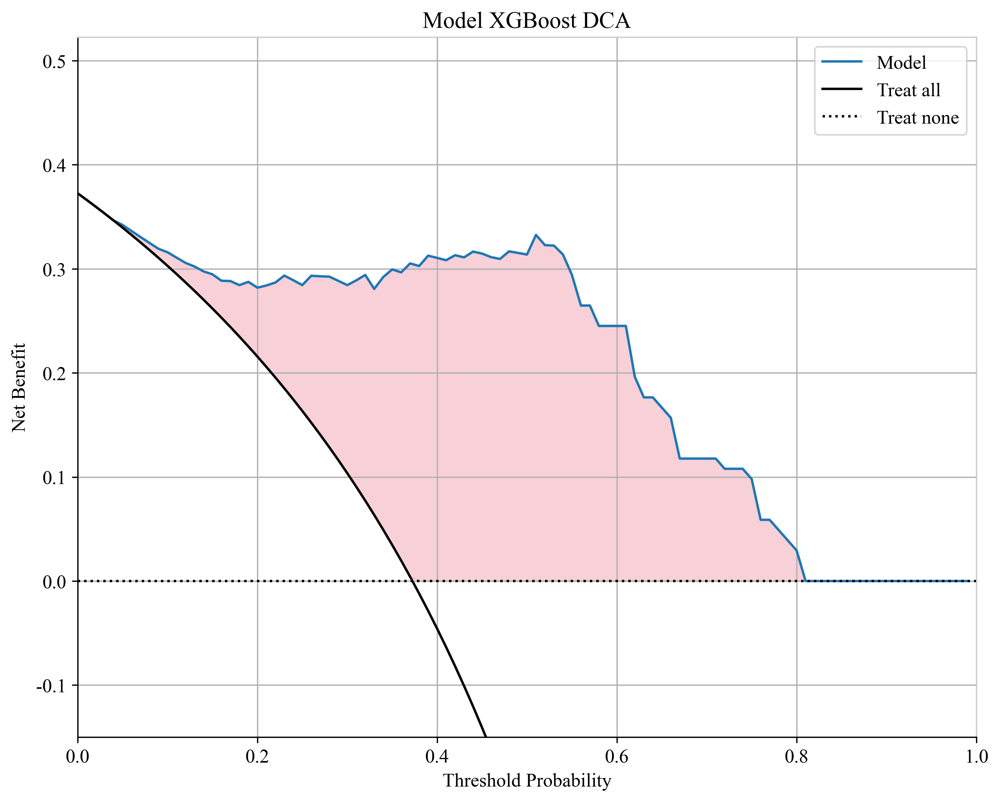

...

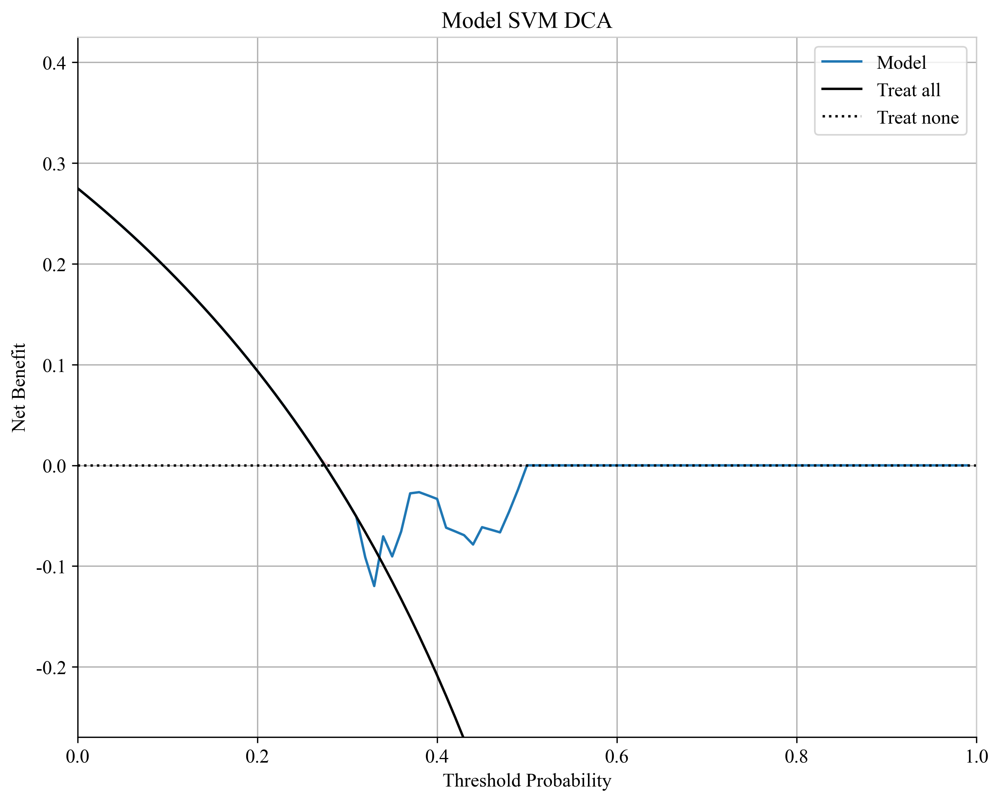

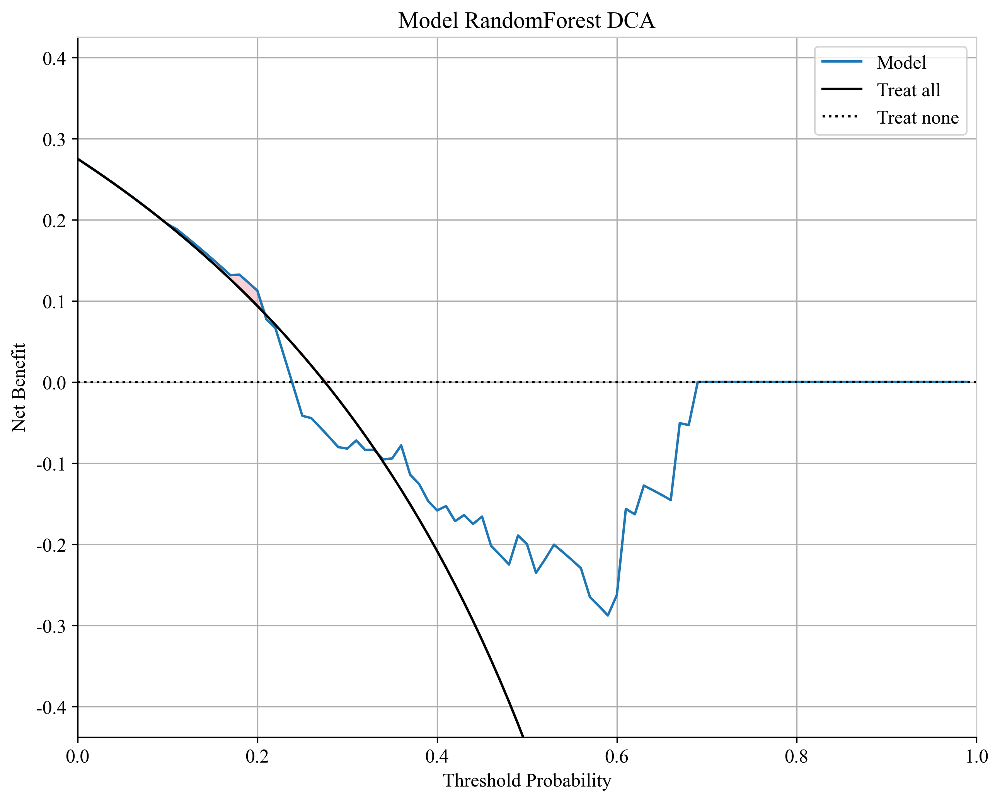

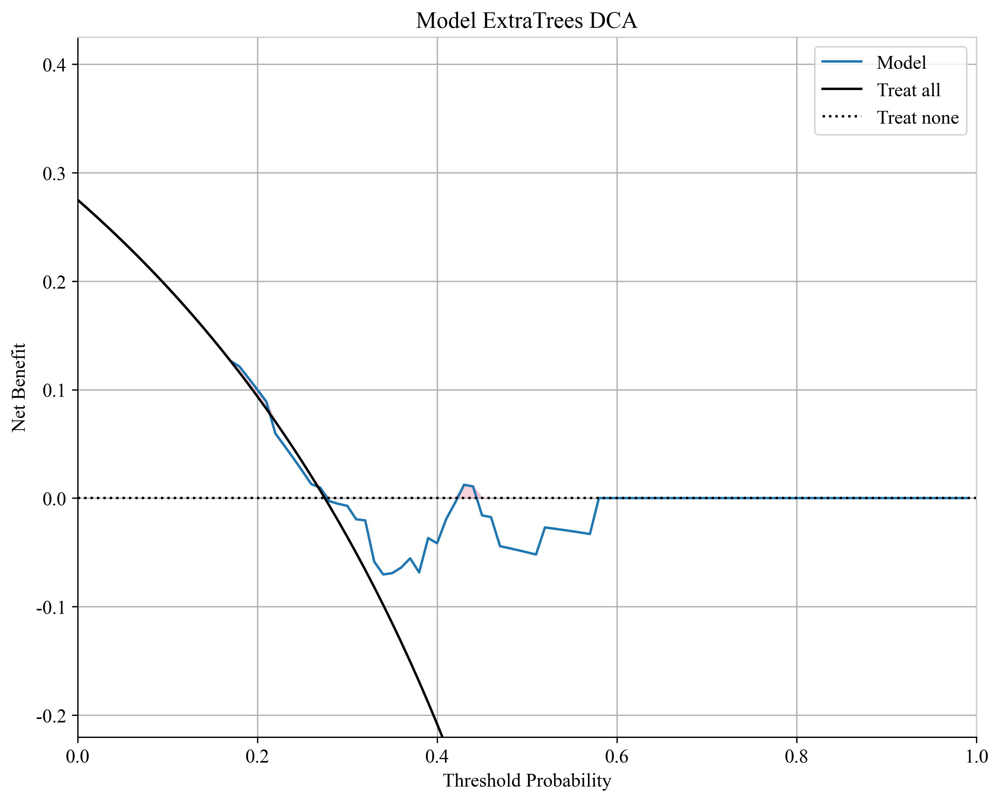

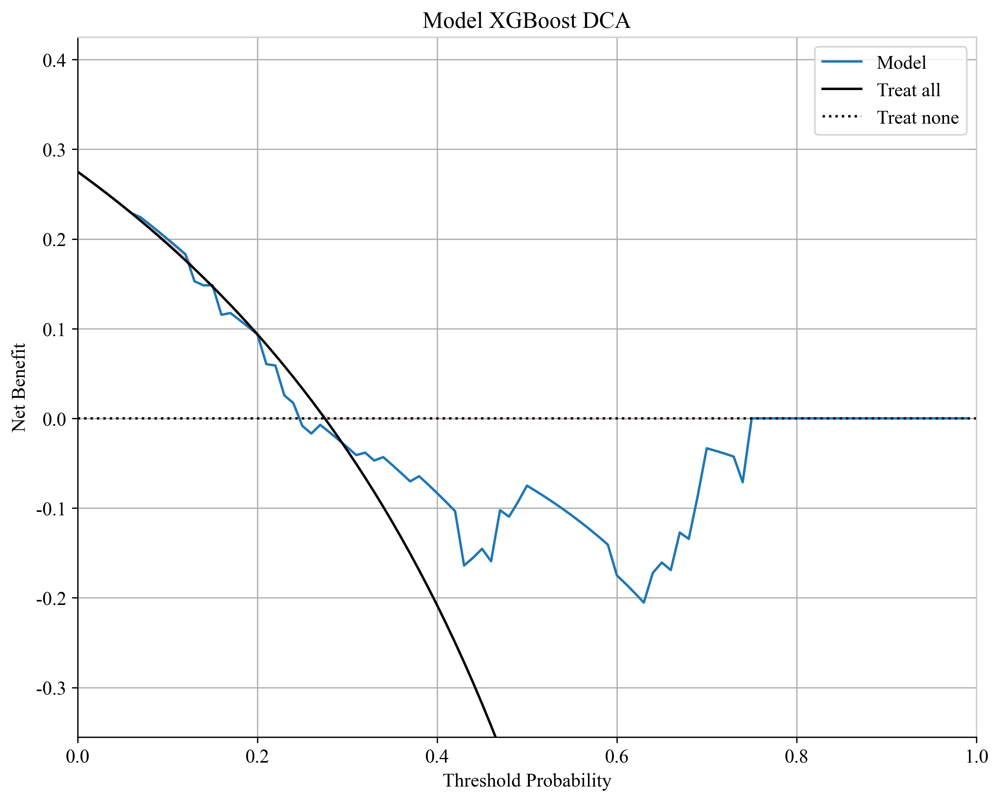

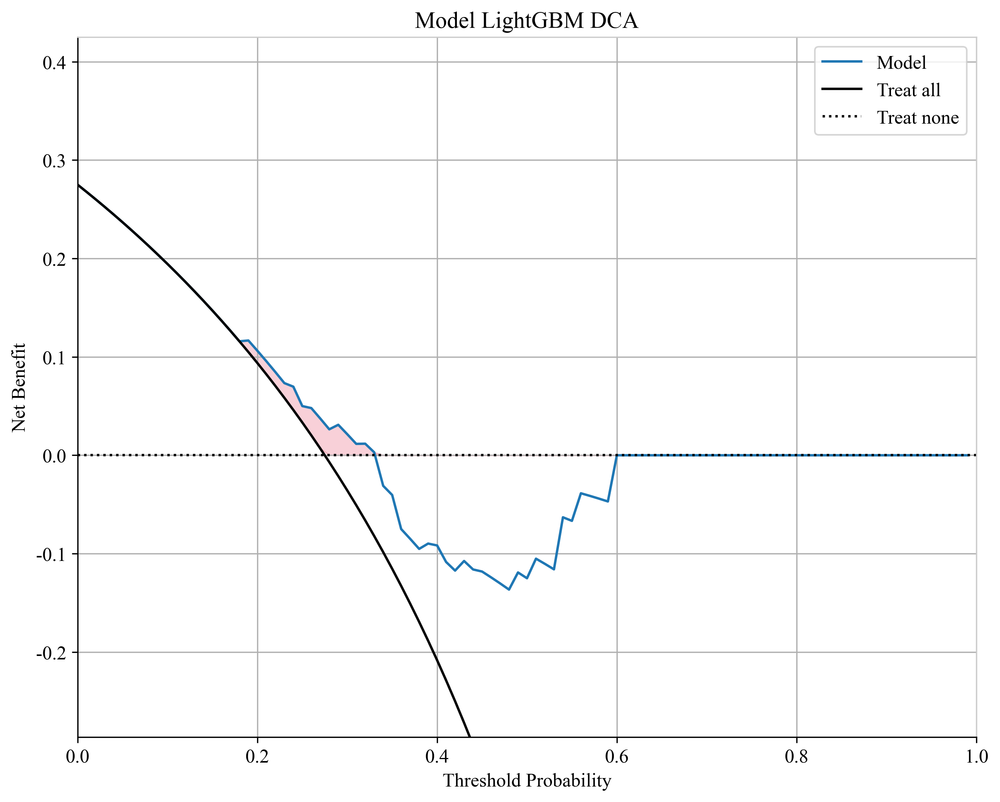

In [37]:
from onekey_algo.custom.components.comp1 import plot_DCA

for pred_score, label in zip(pred_scores, labels):
    pred_test_scores = []
    for sm in sel_model:
        if sm in model_names:
            sel_model_idx = model_names.index(sm)
            okcomp.comp1.plot_DCA(pred_score[sel_model_idx][0][:,1], np.array(y_train_sel[label]),
                                  title=f'Model {sm} DCA')
            plt.savefig(f'img/{task_type}model_{sm}_dca_train.svg', bbox_inches = 'tight')
            plt.show()

for pred_score, label in zip(pred_scores, labels):
    pred_test_scores = []
    for sm in sel_model:
        if sm in model_names:
            sel_model_idx = model_names.index(sm)
            okcomp.comp1.plot_DCA(pred_score[sel_model_idx][1][:,1], np.array(y_test_sel[label]),
                                  title=f'Model {sm} DCA')
            plt.savefig(f'img/{task_type}model_{sm}_dca_test.svg', bbox_inches = 'tight')

### 绘制混淆矩阵

绘制混淆矩阵，[混淆矩阵解释](https://baike.baidu.com/item/%E6%B7%B7%E6%B7%86%E7%9F%A9%E9%98%B5/10087822?fr=aladdin)
`sel_model = ['SVM', 'KNN']`参数为想要绘制的模型对应的参数。

如果需要修改标签到名称的映射，修改`class_mapping={1:'1', 0:'0'}`

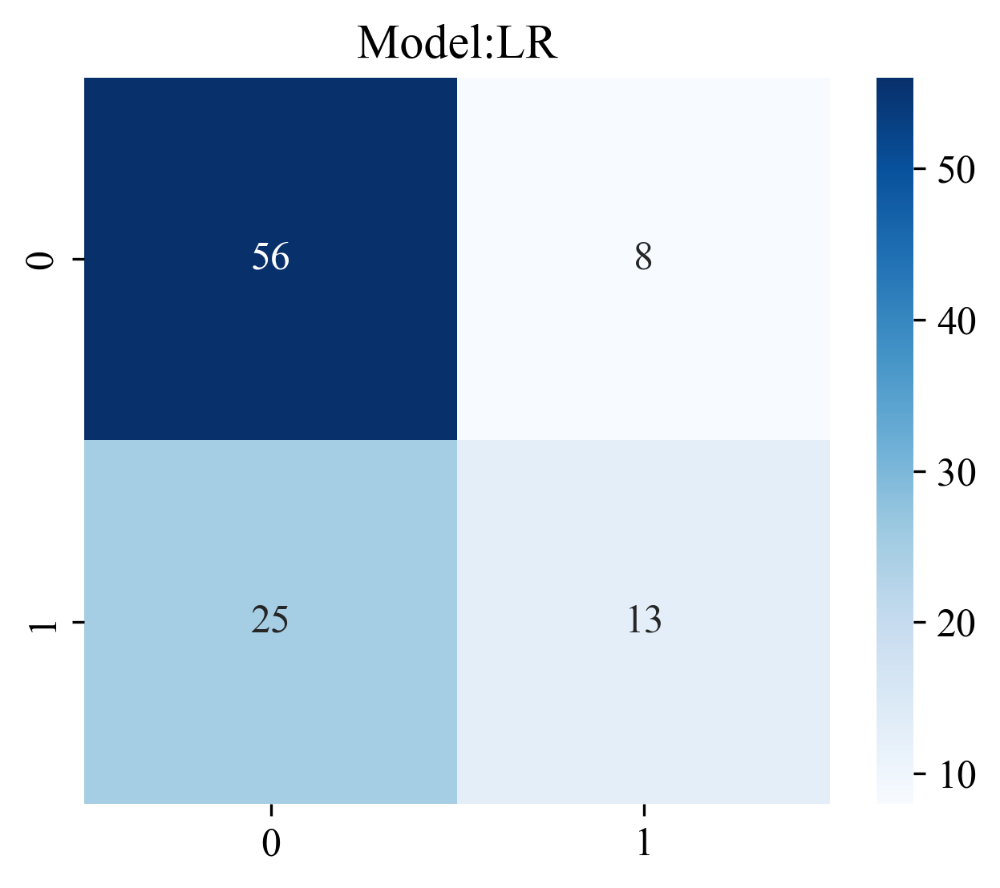

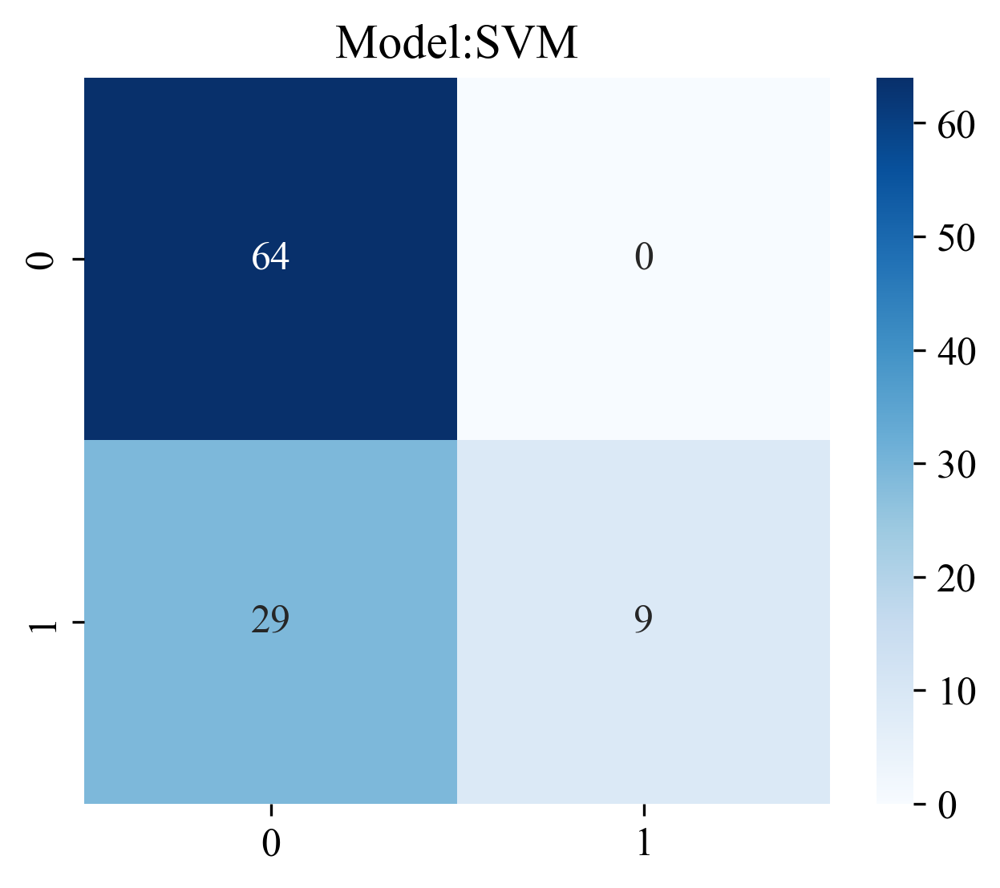

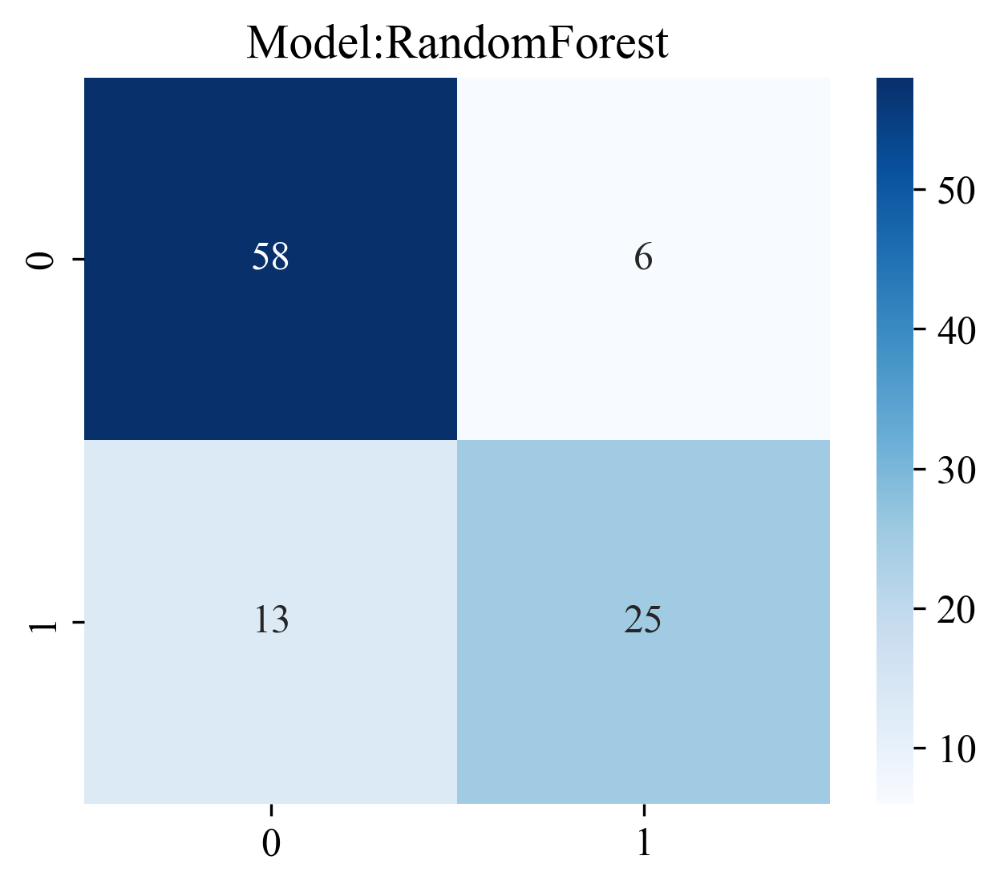

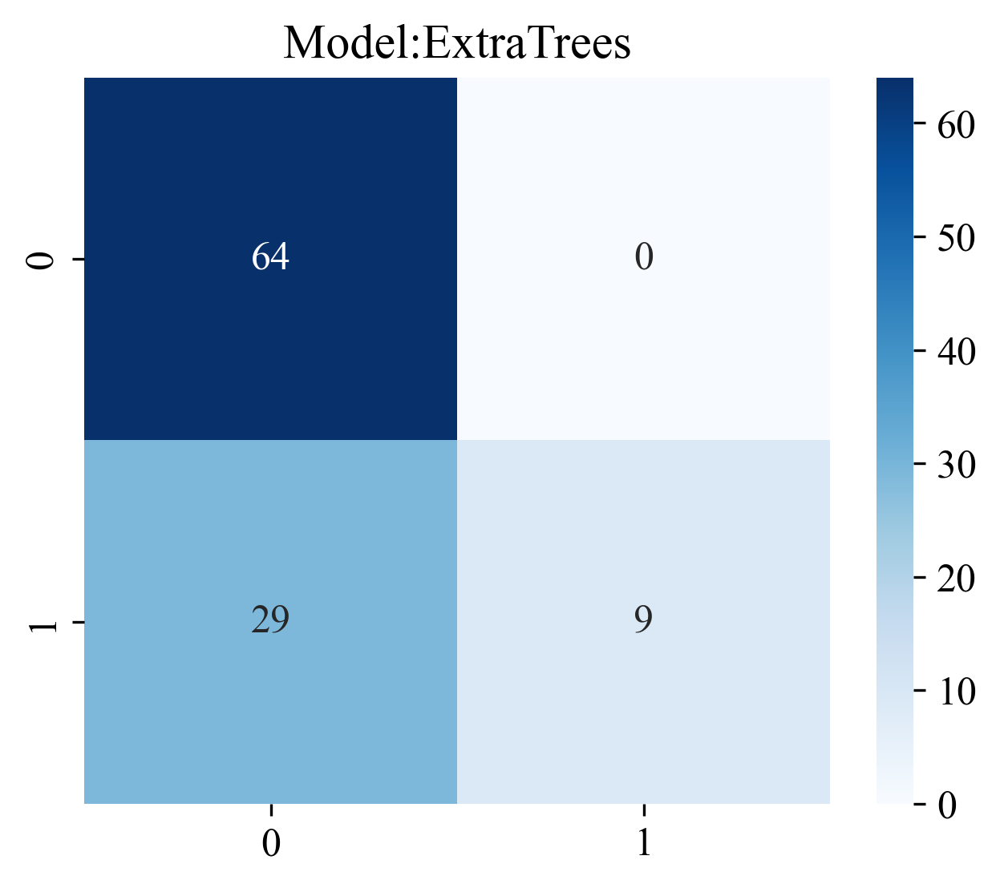

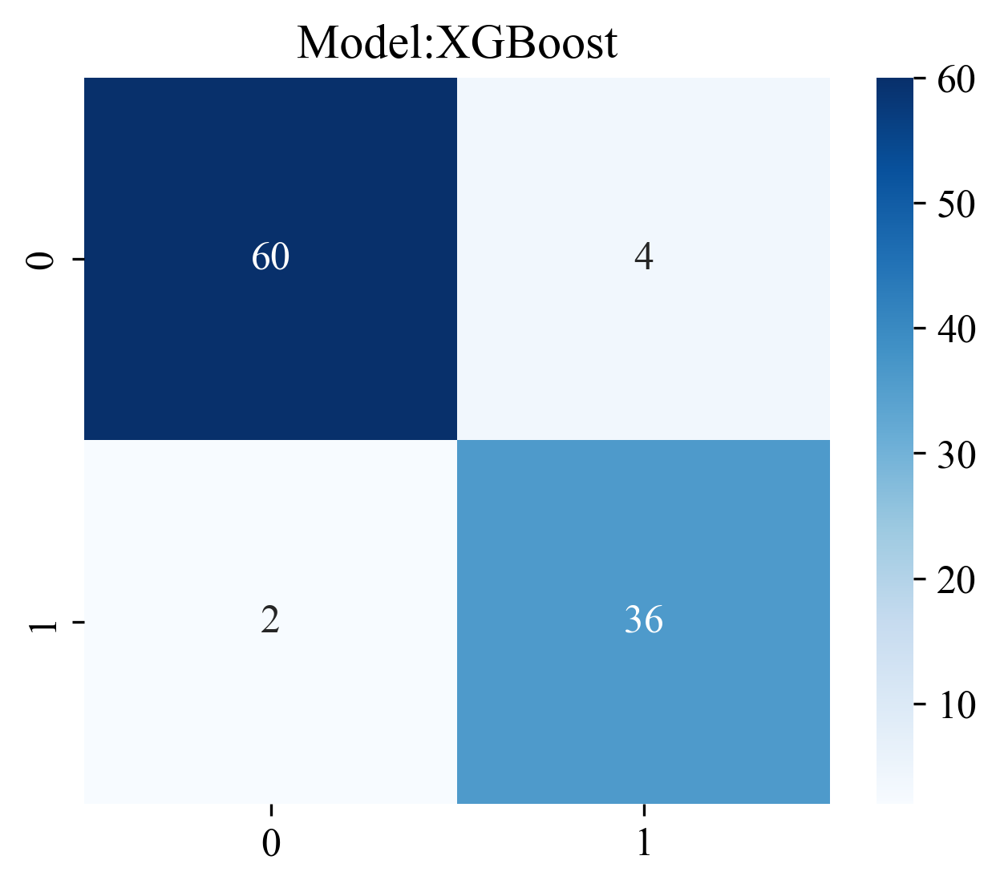

...

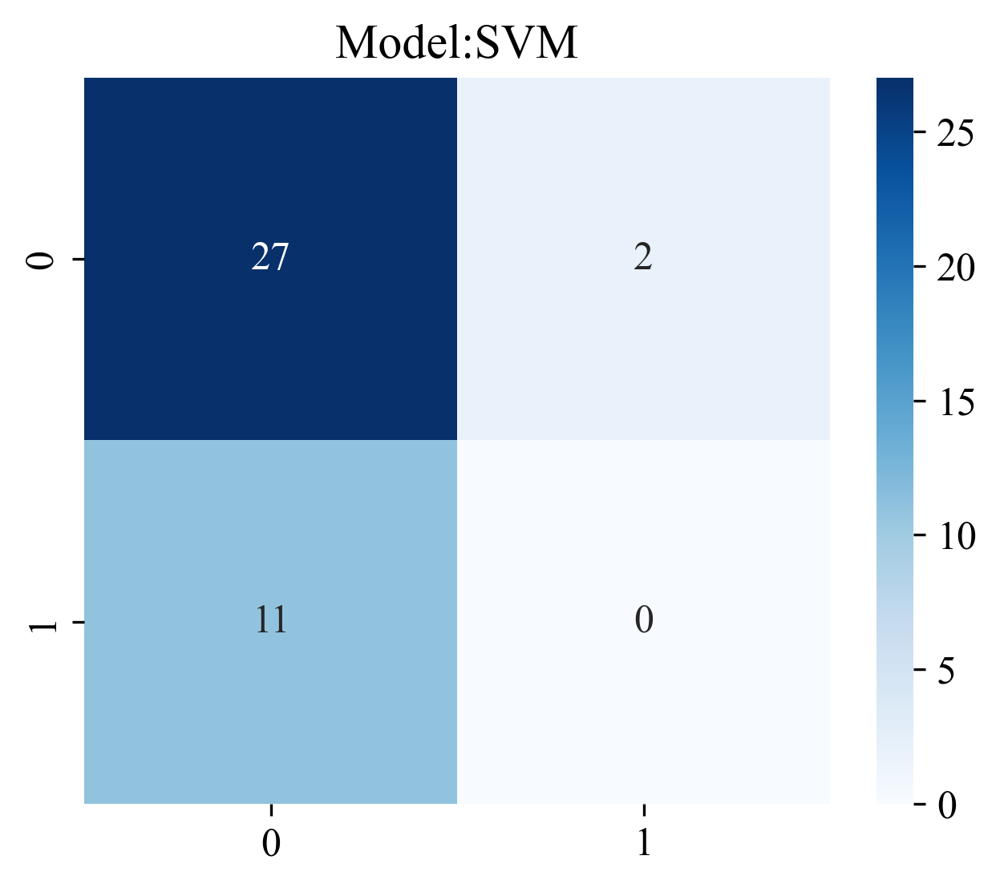

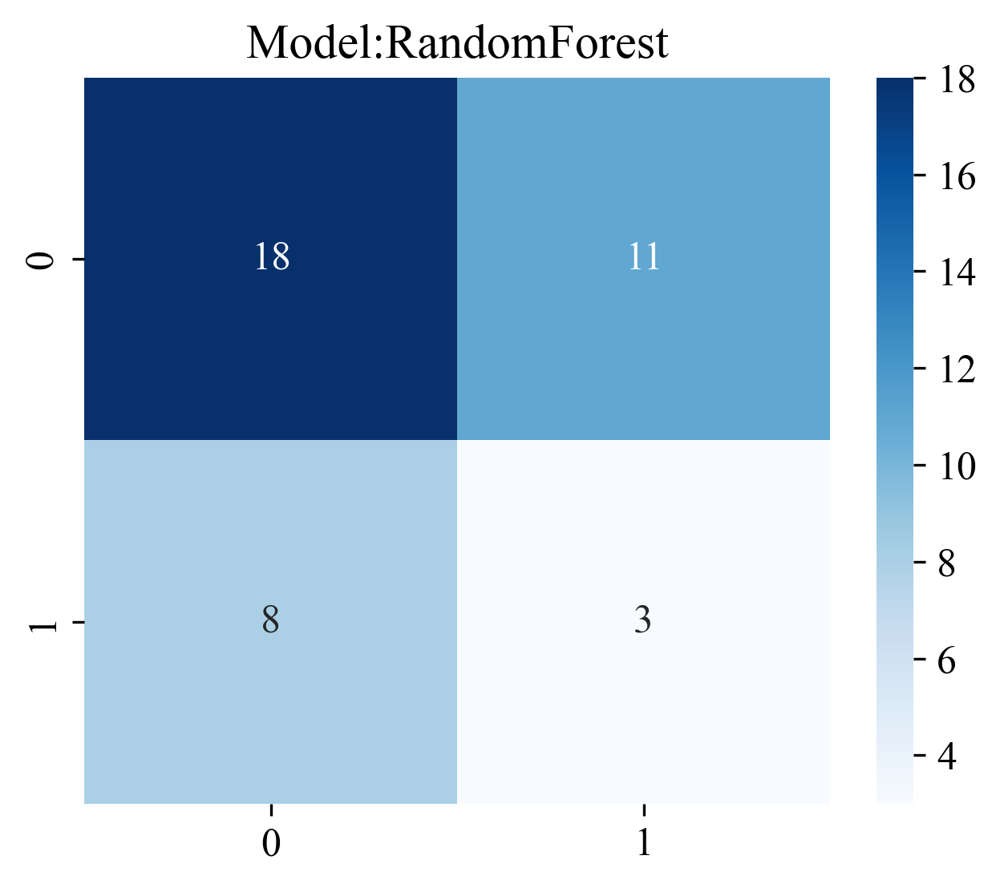

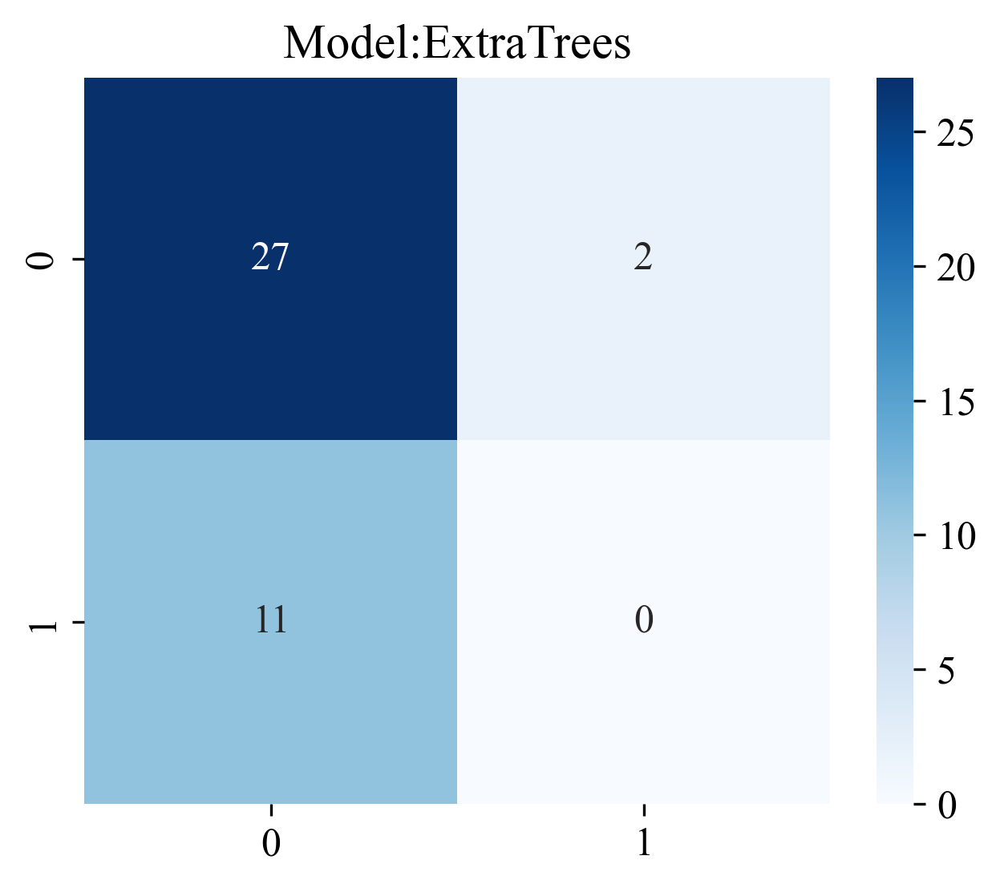

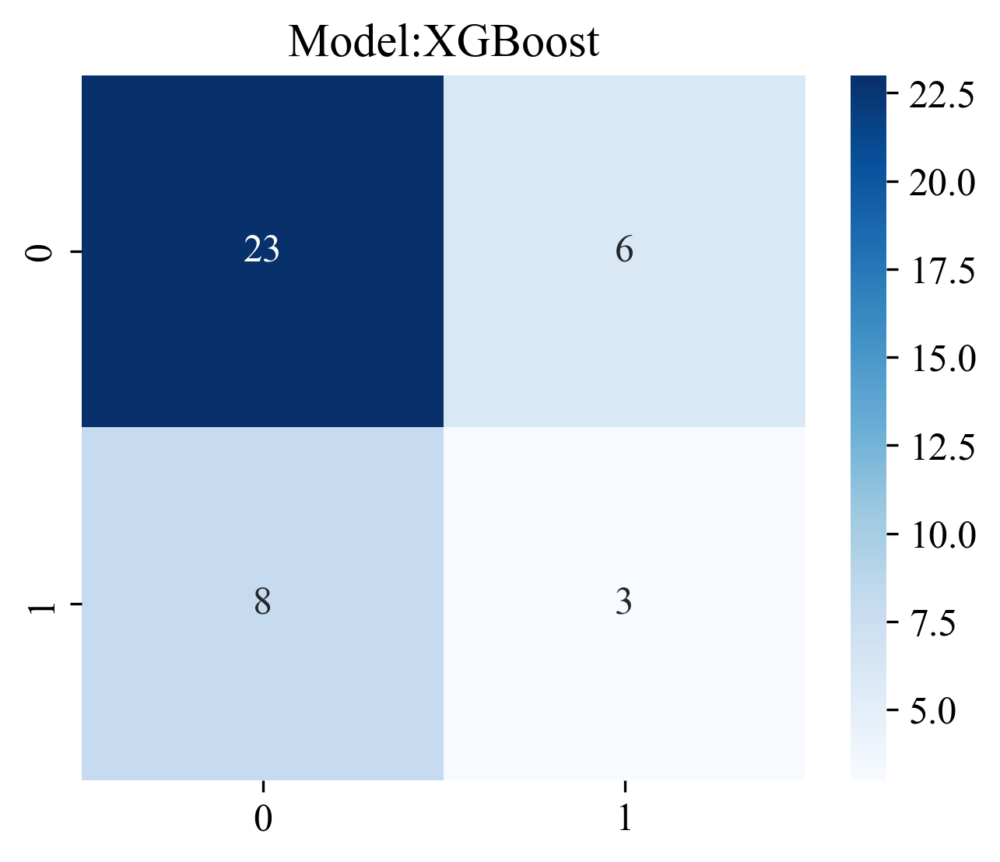

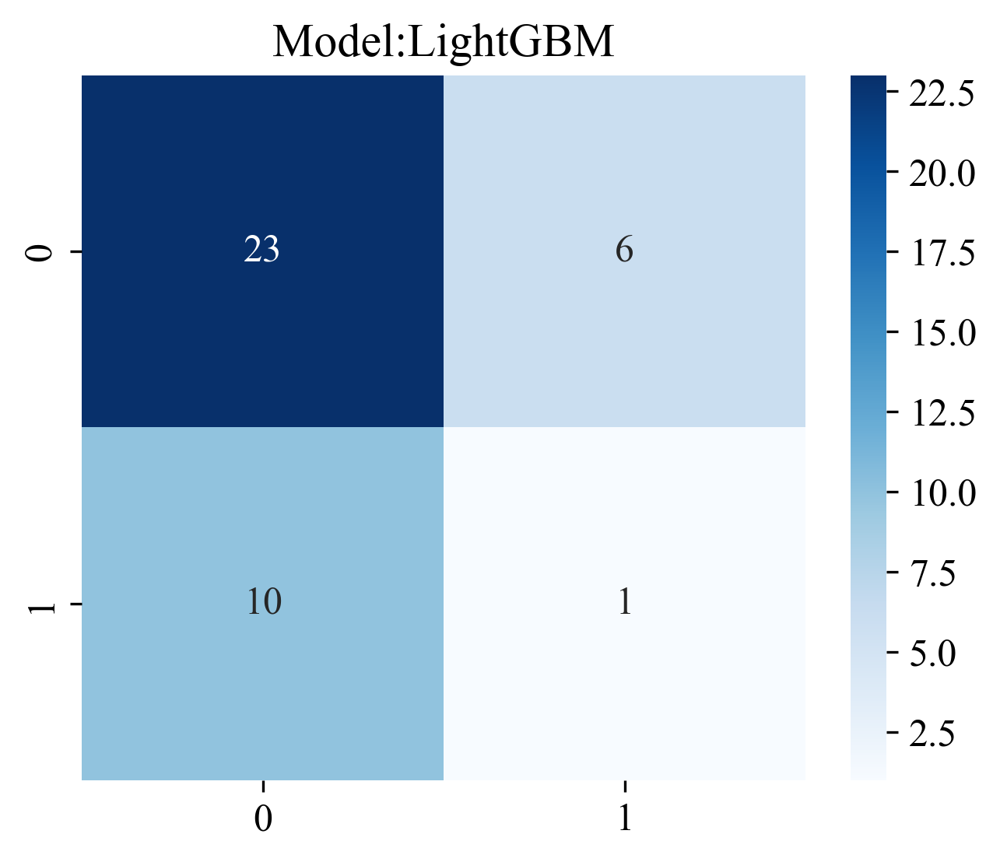

In [38]:
# 设置绘制参数
sel_model = model_names
c_matrix = {}

for sm in sel_model:
    if sm in model_names:
        sel_model_idx = model_names.index(sm)
        for idx, label in enumerate(labels):
            cm = okcomp.comp1.calc_confusion_matrix(predictions[idx][sel_model_idx][0], y_train_sel[label],
#                                                     sel_idx = pred_sel_idx[idx][sel_model_idx],
                                                    class_mapping={1:'1', 0:'0'}, num_classes=2)
            c_matrix[label] = cm
            plt.figure(figsize=(5, 4))
            plt.title(f'Model:{sm}')
            okcomp.comp1.draw_matrix(cm, norm=False, annot=True, cmap='Blues', fmt='.3g')
            plt.savefig(f'img/{task_type}model_{sm}_cm_train.svg', bbox_inches = 'tight')

for sm in sel_model:
    if sm in model_names:
        sel_model_idx = model_names.index(sm)
        for idx, label in enumerate(labels):
            cm = okcomp.comp1.calc_confusion_matrix(predictions[idx][sel_model_idx][-1], y_test_sel[label],
#                                                     sel_idx = pred_sel_idx[idx][sel_model_idx],
                                                    class_mapping={1:'1', 0:'0'}, num_classes=2)
            c_matrix[label] = cm
            plt.figure(figsize=(5, 4))
            plt.title(f'Model:{sm}')
            okcomp.comp1.draw_matrix(cm, norm=False, annot=True, cmap='Blues', fmt='.3g')
            plt.savefig(f'img/{task_type}model_{sm}_cm_test.svg', bbox_inches = 'tight')

### 样本预测直方图

绘制每个样本的预测结果以及对应的真实结果, 图例中label=xx可以修改成自己类别的真实标签。

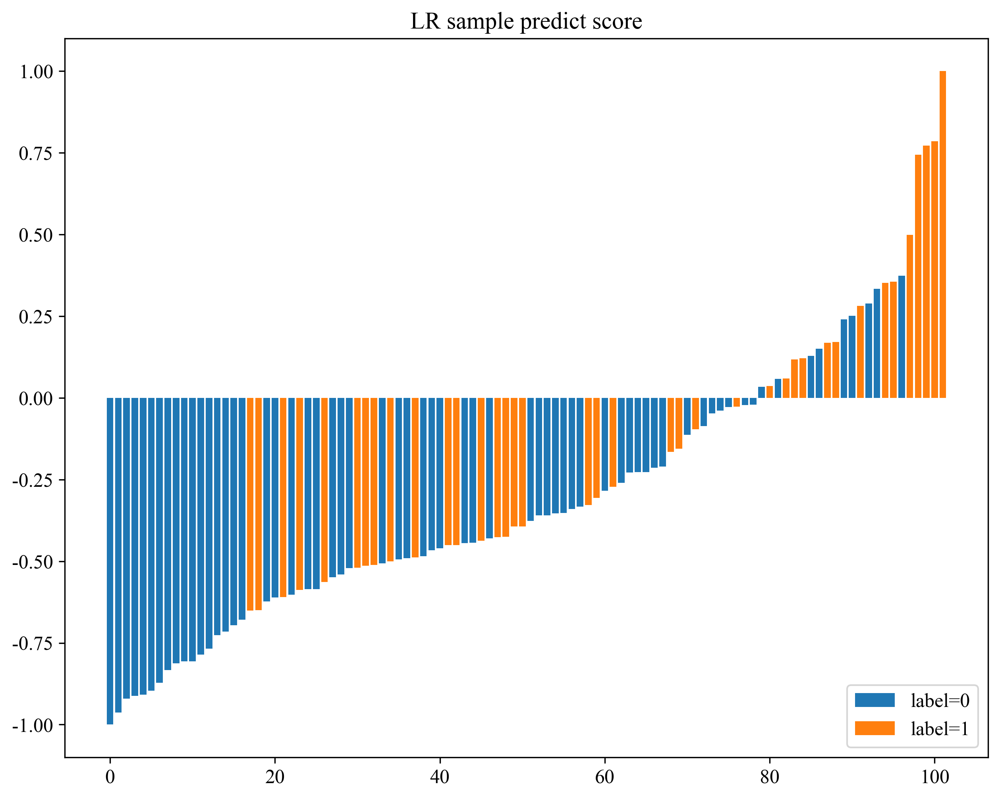

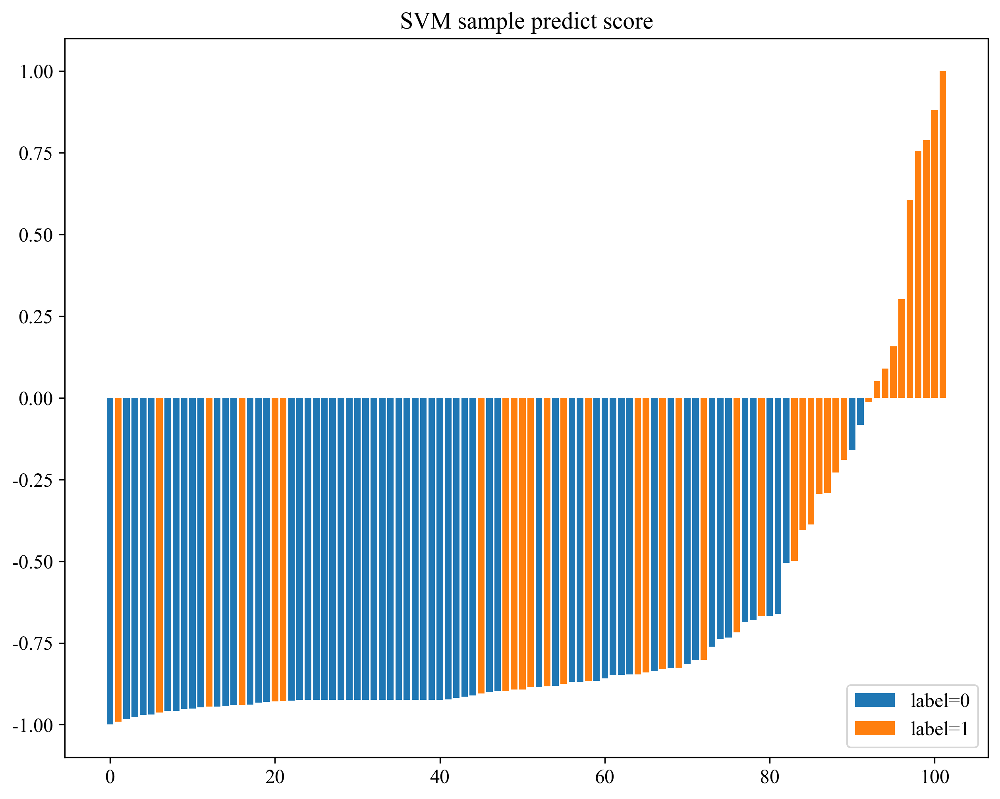

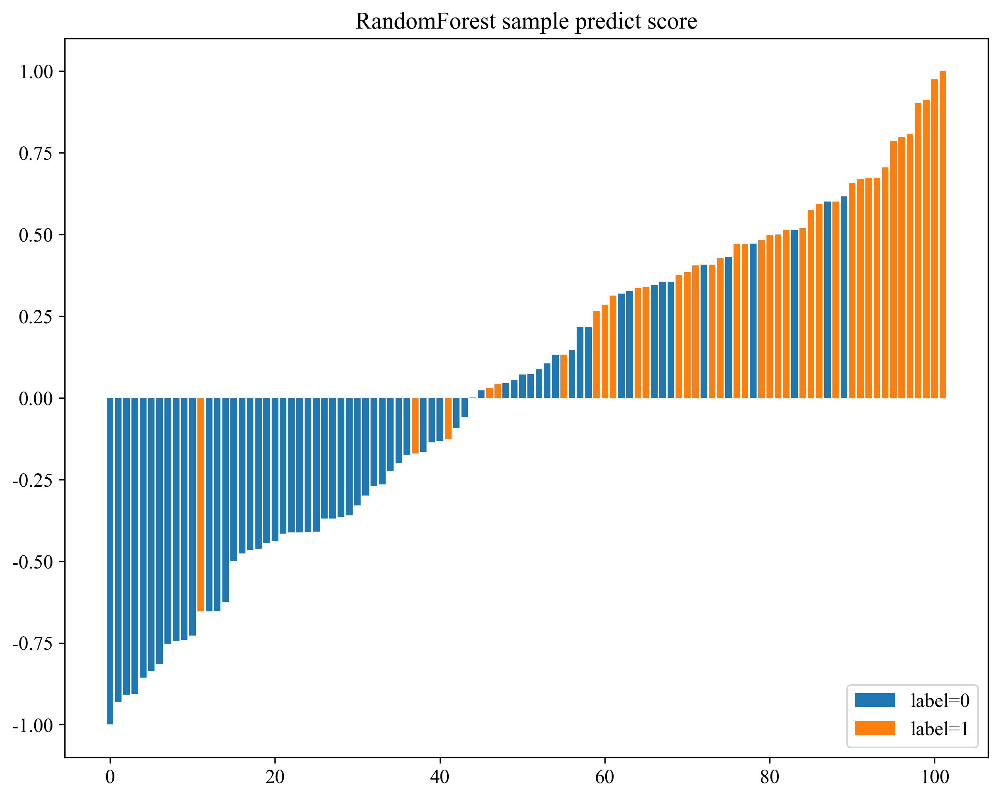

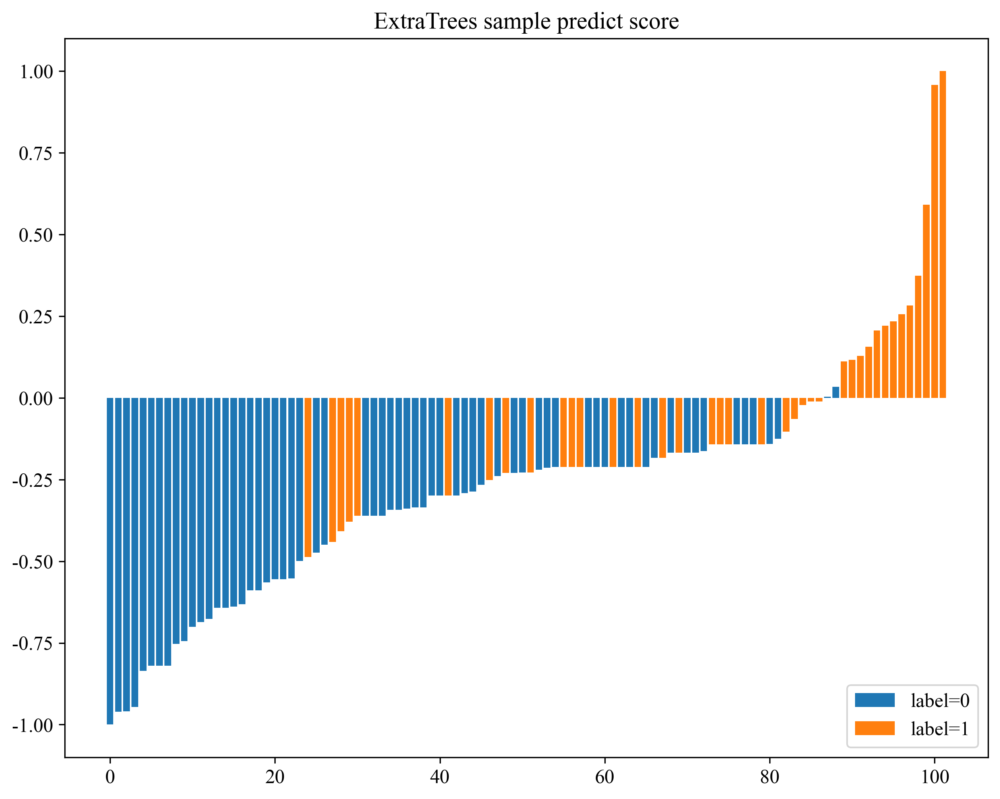

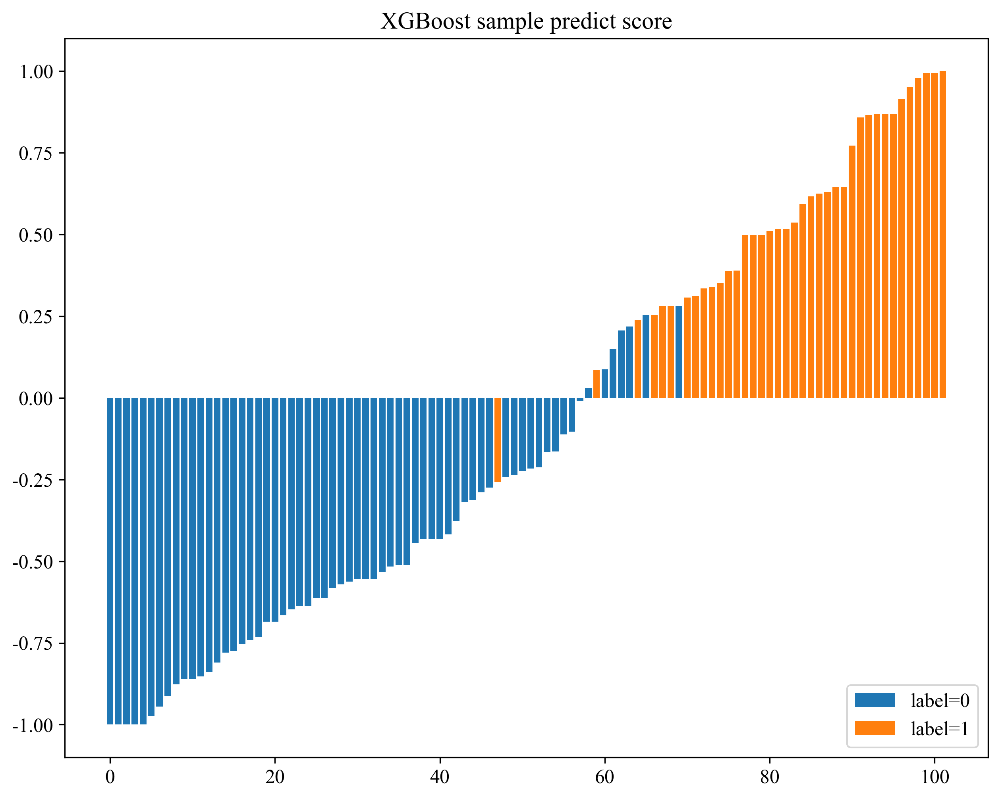

...

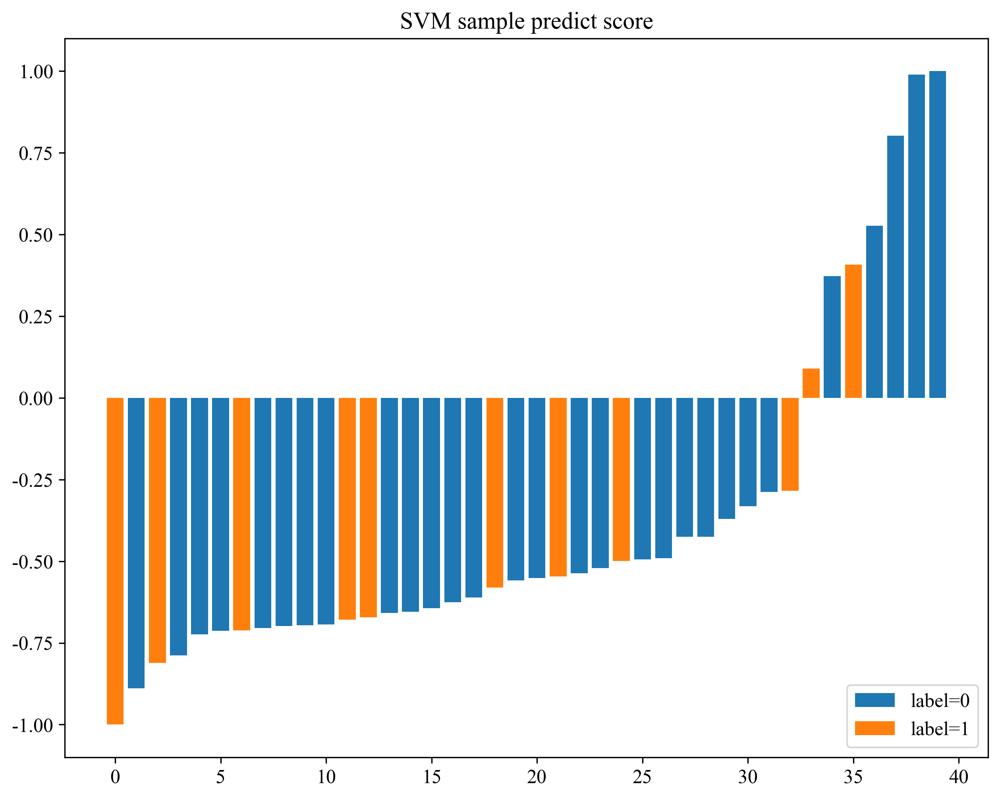

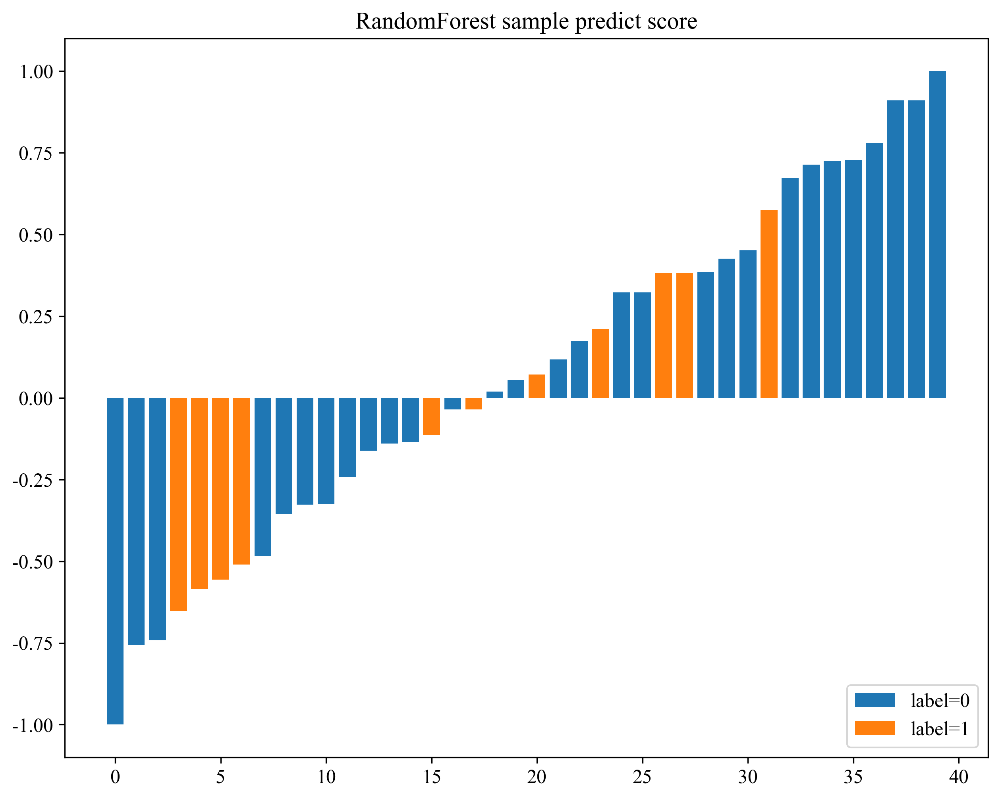

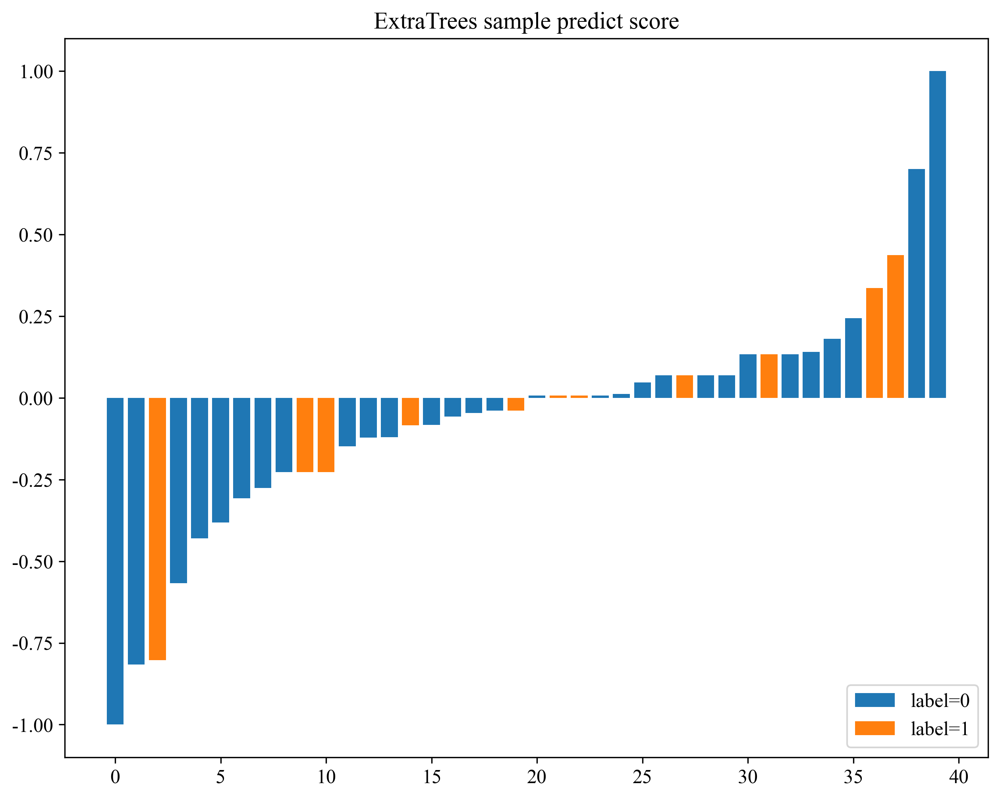

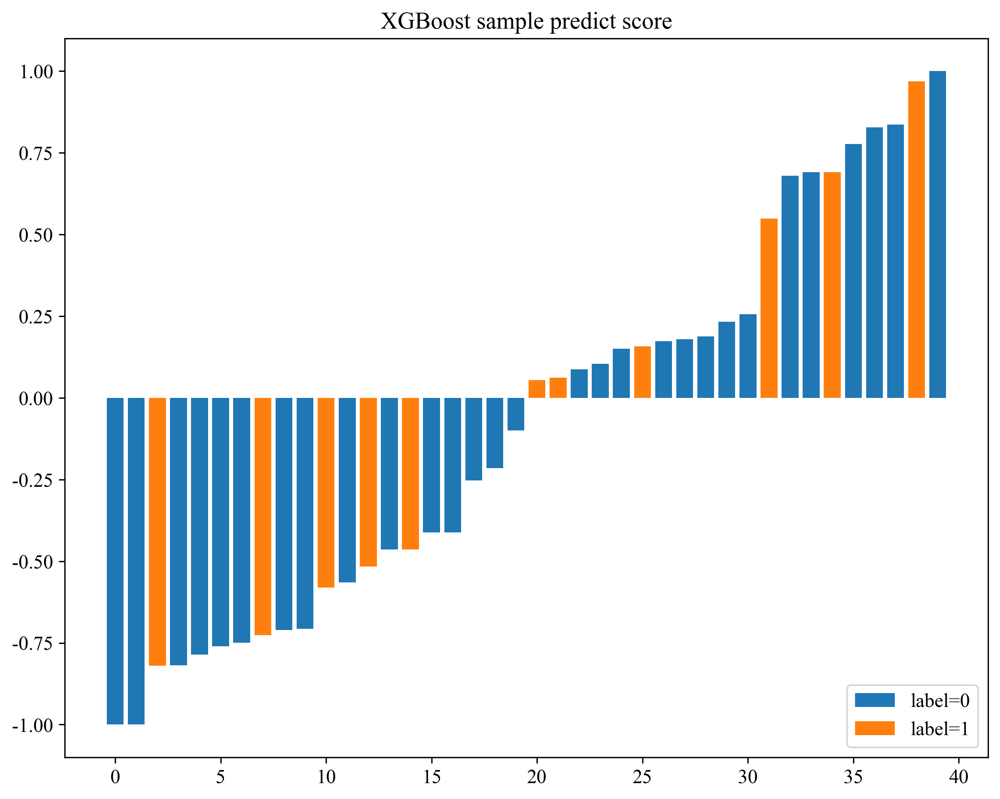

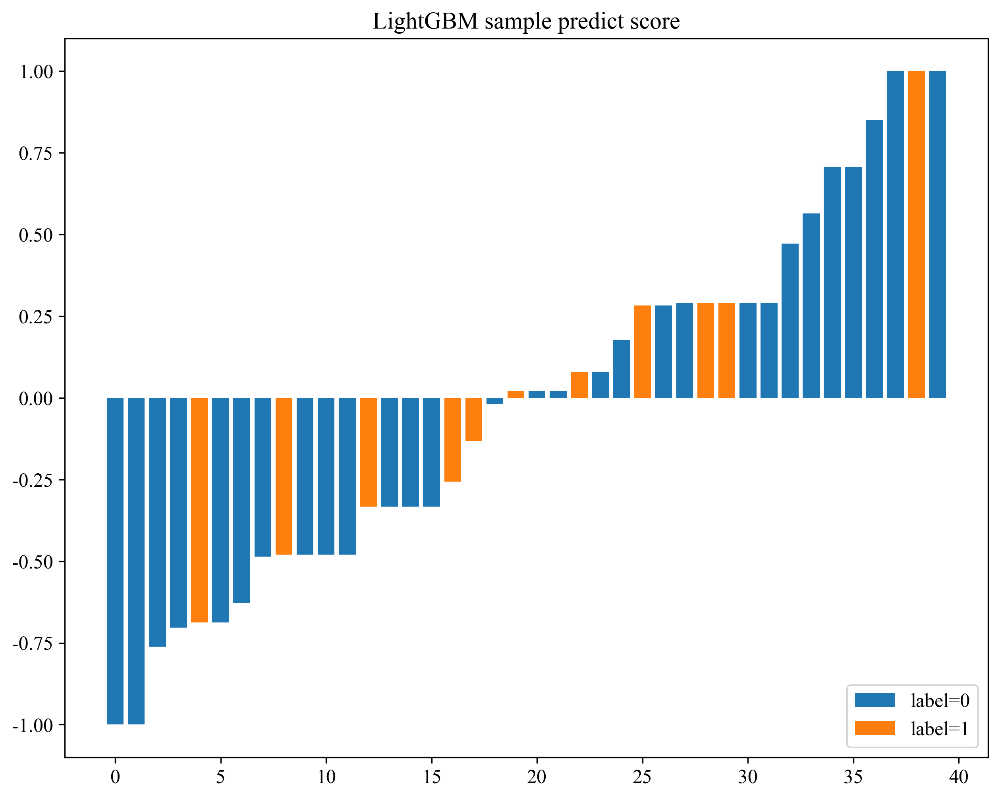

In [39]:
sel_model = model_names
c_matrix = {}

for sm in sel_model:
    if sm in model_names:
        sel_model_idx = model_names.index(sm)
        for idx, label in enumerate(labels):            
            okcomp.comp1.draw_predict_score(pred_scores[idx][sel_model_idx][0], y_train_sel[label])
            plt.title(f'{sm} sample predict score')
            plt.legend(labels=["label=0","label=1"],loc="lower right") 
            plt.savefig(f'img/{task_type}model_{sm}_sample_dis_train.svg', bbox_inches = 'tight')
            plt.show()

for sm in sel_model:
    if sm in model_names:
        sel_model_idx = model_names.index(sm)
        for idx, label in enumerate(labels):            
            okcomp.comp1.draw_predict_score(pred_scores[idx][sel_model_idx][-1], y_test_sel[label])
            plt.title(f'{sm} sample predict score')
            plt.legend(labels=["label=0","label=1"],loc="lower right") 
            plt.savefig(f'img/{task_type}model_{sm}_sample_dis_test.svg', bbox_inches = 'tight')
            plt.show()

## 保存模型结果

可以把模型预测的标签结果以及每个类别的概率都保存下来。

In [40]:
import os
import numpy as np

os.makedirs('results', exist_ok=True)
sel_model = sel_model

for idx, label in enumerate(labels):
    for sm in sel_model:
        if sm in model_names:
            sel_model_idx = model_names.index(sm)
            target = targets[idx][sel_model_idx]
            # 预测训练集和测试集数据。
            train_indexes = np.reshape(np.array(train_ids), (-1, 1)).astype(str)
            test_indexes = np.reshape(np.array(test_ids), (-1, 1)).astype(str)
            y_train_pred_scores = target.predict_proba(X_train_sel)
            y_test_pred_scores = target.predict_proba(X_test_sel)
            columns = ['ID'] + [f"{label}-{i}"for i in range(y_test_pred_scores.shape[1])]
            # 保存预测的训练集和测试集结果
            result_train = pd.DataFrame(np.concatenate([train_indexes, y_train_pred_scores], axis=1), columns=columns)
            result_train.to_csv(f'results/{task_type}{sm}_train.csv', index=False)
            result_test = pd.DataFrame(np.concatenate([test_indexes, y_test_pred_scores], axis=1), columns=columns)
            result_test.to_csv(f'results/{task_type}{sm}_test.csv', index=False)